# **Trash Segmentation for Recycling**

**Group 1: The Minh Nguyen, Jessika Noenchen, Jacob Trombley, Alice Zhang**

MIE1517F

Date: December 7, 2025

## Introduction

The model we propose is a trash segmentation classifier that can be used to sort trash into six different classes.

With a growing population and worsening  consumerism, trash production globally is on the rise, which leads to serious environmental impacts such as pollution, endangerement to wildlife, and ecosystem harm.

The proper classification of trash can therefore reduce landfill overflow by ensuring recyclable materials are effectively sorted. Having a successful trash classification prototype can pave the way for real-time automated trash sorting when integrated with the appropriate machinery, ultimately leading to a cleaner planet by the reduction in the harmful effects of increasing trash.

## Model in Action

In [104]:
https://drive.google.com/file/d/12BwEqvukLrTaHB9l3zL8nYT7-_0KEIMj/view?usp=share_link

SyntaxError: invalid decimal literal (ipython-input-3676059833.py, line 1)

In [ ]:
https://drive.google.com/file/d/1OfMAfe-gWsuCzcWul_AVnzflsWUxSjbQ/view?usp=share_link

In [ ]:
# ------------------------------------------#
# ------------------------------------------#
# IMAGE OF OUR MODEL RESULTS IN ACTION HERE #
# ------------------------------------------#
# ------------------------------------------#

In [2]:
# set global directory
global_path = '/content/drive/MyDrive/MIE1517 Group Project'
first_run = False # set to True if it is the first time running

In [4]:
from google.colab import drive

In [5]:
drive.mount('/content/drive') # mount to drive

Mounted at /content/drive


In [14]:
import json
import random
from PIL import Image, ImageDraw, ImageFont

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

# pick 3-5 examples
N = 4
indices = random.sample(range(len(filepaths)), N)

orig_imgs = []
pred_imgs = []

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    # load original
    img = Image.open(img_path).convert("RGB")

    # build copy for predictions
    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)
    draw.text((10, 10), f"Predicted: {pred_class}", fill=(255, 0, 0))

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# assume all same size
w, h = orig_imgs[0].size
collage = Image.new("RGB", (w * 2, h * N), "white")

for i in range(N):
    y = i * h
    collage.paste(orig_imgs[i], (0, y))
    collage.paste(pred_imgs[i], (w, y))

collage.save("model_in_action_collage.jpg")
print("Saved model_in_action_collage.jpg")


Saved model_in_action_collage.jpg


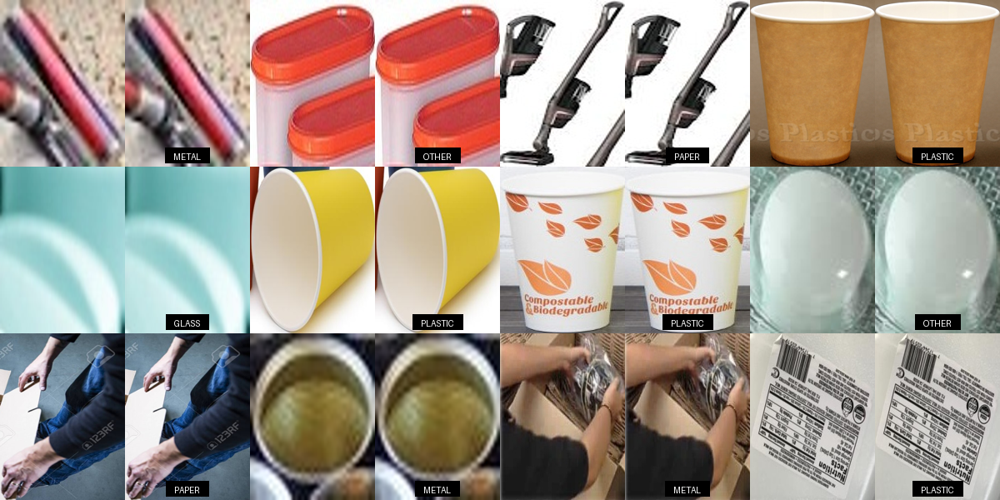

In [28]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

# number of rows and columns (orig + pred)
num_rows = 3
num_cols = 4   # number of original images (predictions also show beside each)

total = num_rows * num_cols

# consistent image size
W, H = 150, 200

# pick random examples
indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

# bigger font
try:
    font = ImageFont.truetype("arial.ttf", 32)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    # text size
    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    # center label at bottom
    x = (W - text_w) // 2
    y = H - text_h - 10

    # background box
    rect = [x - 10, y - 5, x + text_w + 10, y + text_h + 5]
    draw.rectangle(rect, fill=(0, 0, 0, 180))

    draw.text((x, y), text, fill="white", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)


# build collage with grid (2 * num_cols width)
collage_width = num_cols * W * 2      # orig + pred
collage_height = num_rows * H

collage = Image.new("RGB", (collage_width, collage_height), "white")

# paste images in grid
for r in range(num_rows):
    for c in range(num_cols):
        idx = r * num_cols + c

        x_orig = c * 2 * W
        x_pred = x_orig + W
        y = r * H

        collage.paste(orig_imgs[idx], (x_orig, y))
        collage.paste(pred_imgs[idx], (x_pred, y))

# show inline
display(collage)


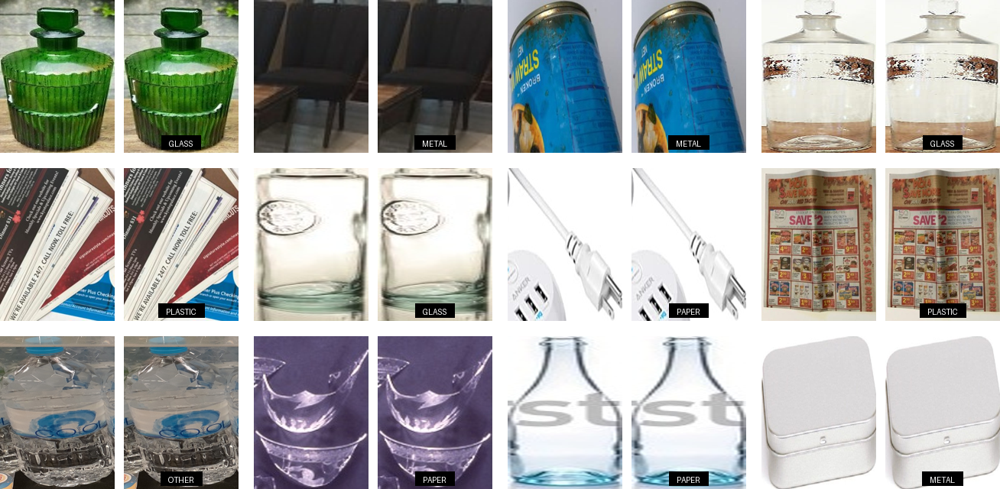

In [29]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# consistent image size
W, H = 150, 200

# spacing around images
PAD = 20         # space between rows and columns
PAIR_PAD = 12    # space between original and prediction

# pick random samples
indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

try:
    font = ImageFont.truetype("arial.ttf", 32)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    x = (W - text_w) // 2
    y = H - text_h - 10

    rect = [x - 10, y - 5, x + text_w + 10, y + text_h + 5]
    draw.rectangle(rect, fill=(0, 0, 0))
    draw.text((x, y), text, fill="white", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# --- Build collage size ---
pair_width = (W * 2) + PAIR_PAD  # original + spacing + pred
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

# --- Paste grid ---
for r in range(num_rows):
    for c in range(num_cols):

        idx = r * num_cols + c

        # top-left coordinates for this cell (pair)
        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        # paste original
        collage.paste(orig_imgs[idx], (x0, y0))

        # paste prediction to the right
        x_pred = x0 + W + PAIR_PAD
        collage.paste(pred_imgs[idx], (x_pred, y0))

# show inline
display(collage)


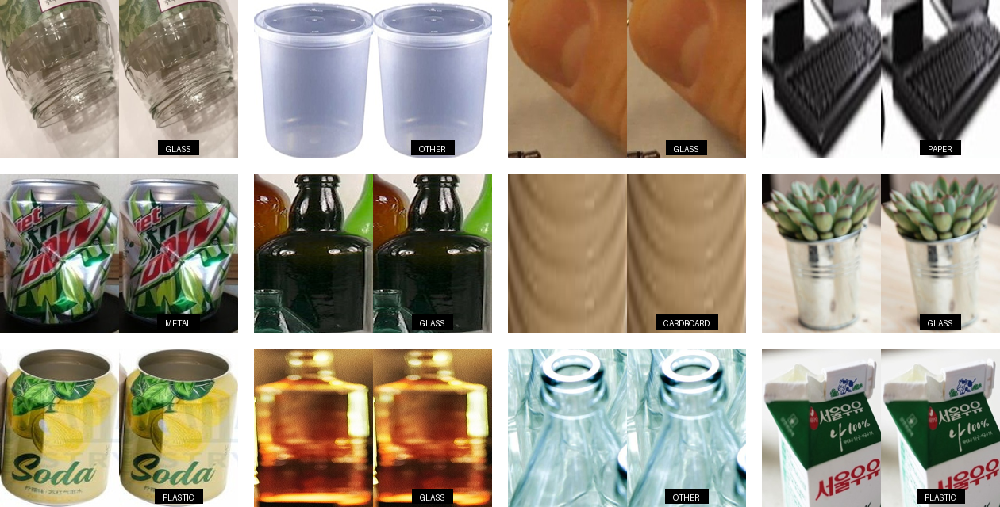

In [30]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# consistent image size
W, H = 150, 200

# spacing around each pair of images
PAD = 20         # space between columns & rows
PAIR_PAD = 0     # <-- NO spacing between original and prediction

# pick random samples
indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

try:
    font = ImageFont.truetype("arial.ttf", 32)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    x = (W - text_w) // 2
    y = H - text_h - 10

    rect = [x - 10, y - 5, x + text_w + 10, y + text_h + 5]
    draw.rectangle(rect, fill=(0, 0, 0))
    draw.text((x, y), text, fill="white", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# --- Build collage size ---
pair_width = (W * 2) + PAIR_PAD  # original + prediction, no gap
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

# --- Paste grid ---
for r in range(num_rows):
    for c in range(num_cols):

        idx = r * num_cols + c

        # base coordinates for this row/col
        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        # paste original
        collage.paste(orig_imgs[idx], (x0, y0))

        # paste prediction directly beside original (no gap)
        collage.paste(pred_imgs[idx], (x0 + W, y0))

# show inline
display(collage)


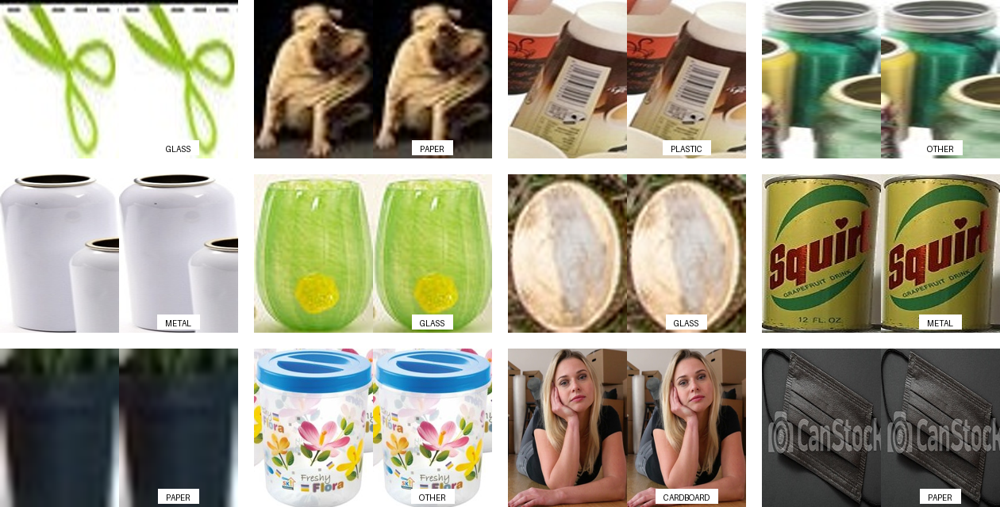

In [31]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# image sizing
W, H = 150, 200

# spacing around each pair
PAD = 20
PAIR_PAD = 0   # no spacing between original and prediction

# pick random test samples
indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

# readable font
try:
    font = ImageFont.truetype("arial.ttf", 32)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    # get text size
    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    # center label at bottom
    x = (W - text_w) // 2
    y = H - text_h - 10

    # white background for label
    rect = [x - 10, y - 5, x + text_w + 10, y + text_h + 5]
    draw.rectangle(rect, fill=(255, 255, 255))

    # black label text
    draw.text((x, y), text, fill="black", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# --- Build final collage ---
pair_width = (W * 2) + PAIR_PAD
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

for r in range(num_rows):
    for c in range(num_cols):
        idx = r * num_cols + c

        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        collage.paste(orig_imgs[idx], (x0, y0))
        collage.paste(pred_imgs[idx], (x0 + W, y0))

# display inline
display(collage)


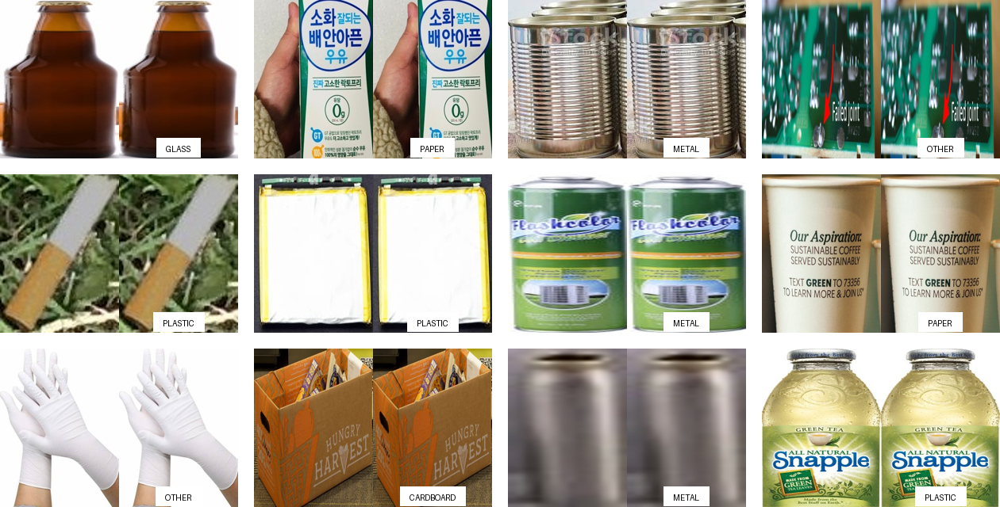

In [103]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "other",
    4: "paper",
    5: "plastic"
}

# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# image sizing
W, H = 150, 200

# spacing between cell groups
PAD = 20
PAIR_PAD = 0

# pick random samples
indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

# BIGGER FONT
try:
    font = ImageFont.truetype("arial.ttf", 100)  # <--- Increased size
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    # measure text size
    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    # centered at bottom
    x = (W - text_w) // 2
    y = H - text_h - 10

    # white label background
    rect = [x - 12, y - 8, x + text_w + 12, y + text_h + 8]
    draw.rectangle(rect, fill=(255, 255, 255))

    # black label text
    draw.text((x, y), text, fill="black", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# build collage
pair_width = (W * 2) + PAIR_PAD
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

for r in range(num_rows):
    for c in range(num_cols):

        idx = r * num_cols + c
        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        collage.paste(orig_imgs[idx], (x0, y0))
        collage.paste(pred_imgs[idx], (x0 + W, y0))

# display inline
display(collage)

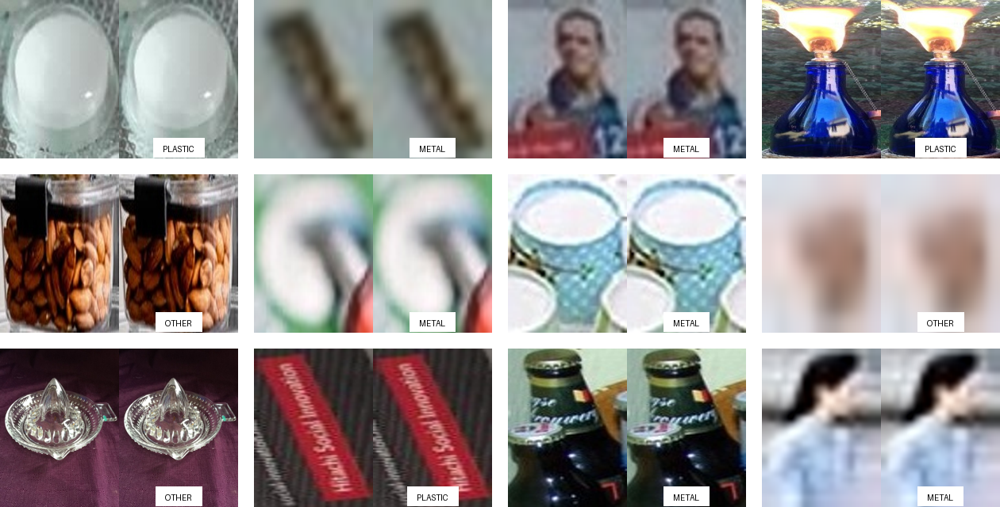

In [102]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "other",
    4: "paper",
    5: "plastic"
}




# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# image sizing
W, H = 150, 200

# spacing
PAD = 20
PAIR_PAD = 0

# ---- NEW: filter for correct predictions only ----
correct_indices = [i for i in range(len(preds)) if preds[i] != gts[i]]

if len(correct_indices) < total:
    raise ValueError(f"Not enough correct predictions ({len(correct_indices)}) to fill grid of size {total}")

indices = random.sample(correct_indices, total)
# ---------------------------------------------------

orig_imgs = []
pred_imgs = []

# BIGGER FONT
try:
    font = ImageFont.truetype("arial.ttf", 100)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    x = (W - text_w) // 2
    y = H - text_h - 10

    rect = [x - 12, y - 8, x + text_w + 12, y + text_h + 8]
    draw.rectangle(rect, fill=(255, 255, 255))

    draw.text((x, y), text, fill="black", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# build collage
pair_width = (W * 2) + PAIR_PAD
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

for r in range(num_rows):
    for c in range(num_cols):
        idx = r * num_cols + c

        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        collage.paste(orig_imgs[idx], (x0, y0))
        collage.paste(pred_imgs[idx], (x0 + W, y0))

display(collage)


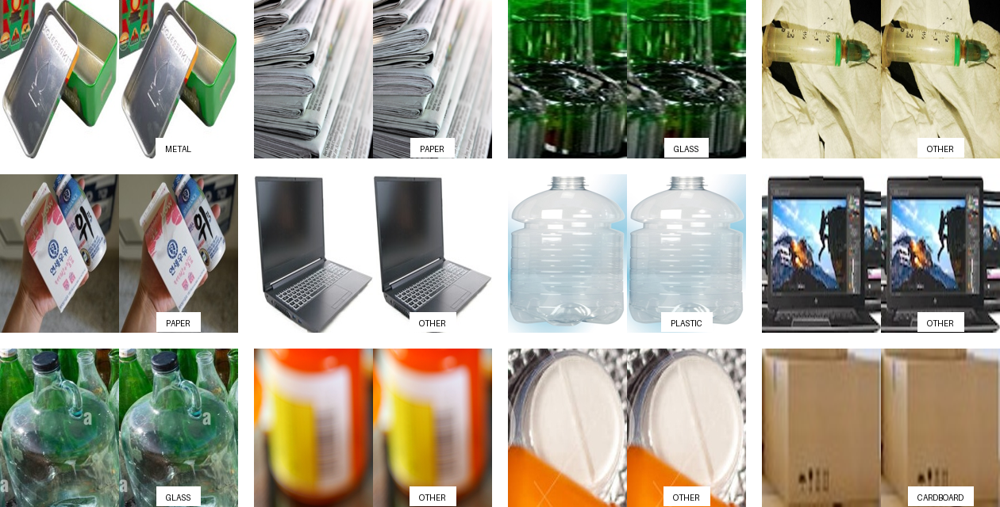

In [78]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "other",
    4: "paper",
    5: "plastic"
}




# grid size
num_rows = 3
num_cols = 4
total = num_rows * num_cols

# image sizing
W, H = 150, 200

# spacing
PAD = 20
PAIR_PAD = 0

# ---- NEW: filter for correct predictions only ----
correct_indices = [i for i in range(len(preds)) if preds[i] == gts[i]]

if len(correct_indices) < total:
    raise ValueError(f"Not enough correct predictions ({len(correct_indices)}) to fill grid of size {total}")

indices = random.sample(correct_indices, total)
# ---------------------------------------------------

orig_imgs = []
pred_imgs = []

# BIGGER FONT
try:
    font = ImageFont.truetype("arial.ttf", 100)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    x = (W - text_w) // 2
    y = H - text_h - 10

    rect = [x - 12, y - 8, x + text_w + 12, y + text_h + 8]
    draw.rectangle(rect, fill=(255, 255, 255))

    draw.text((x, y), text, fill="black", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# build collage
pair_width = (W * 2) + PAIR_PAD
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

for r in range(num_rows):
    for c in range(num_cols):
        idx = r * num_cols + c

        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        collage.paste(orig_imgs[idx], (x0, y0))
        collage.paste(pred_imgs[idx], (x0 + W, y0))

display(collage)


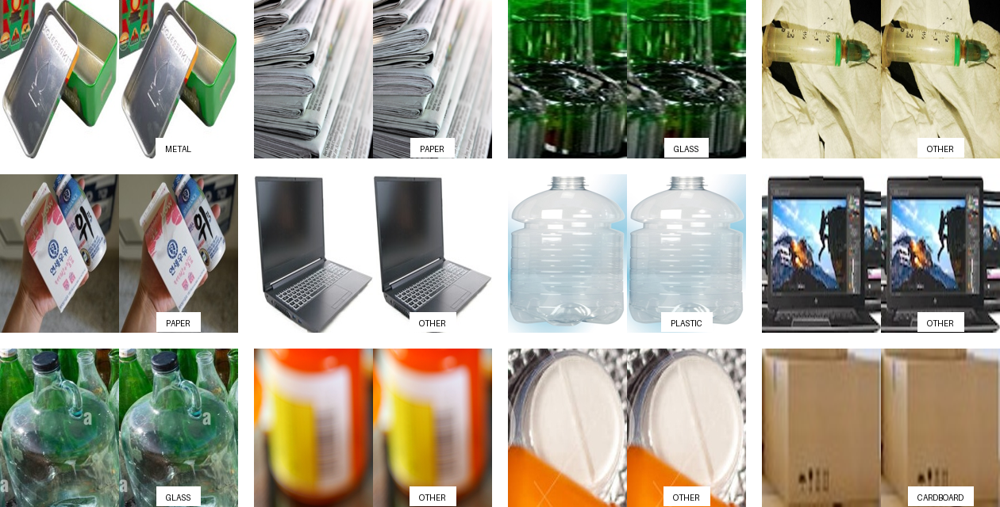

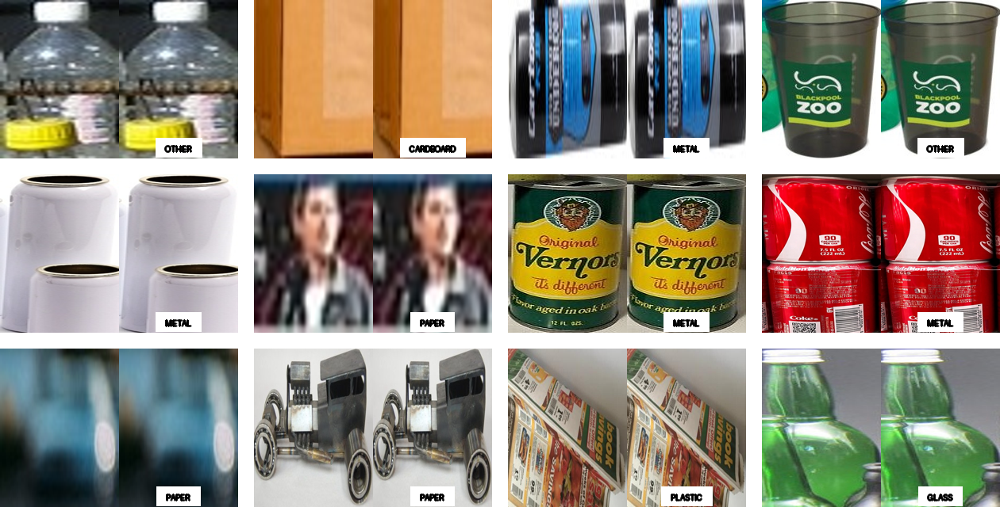

In [40]:
import json
import random
from PIL import Image, ImageDraw, ImageFont
from IPython.display import display

# Load JSON
json_path = f"{global_path}/experiments/classifier/predictions_all_cropped_best_optuna_2025-11-22_10-48-50.json"
with open(json_path, "r") as f:
    data = json.load(f)

filepaths = data["test"]["filepaths"]
preds = data["test"]["predictions"]
gts = data["test"]["ground_truths"]

class_map = {
    0: "cardboard",
    1: "glass",
    2: "metal",
    3: "paper",
    4: "plastic",
    5: "other"
}

num_rows = 3
num_cols = 4
total = num_rows * num_cols

W, H = 150, 200

PAD = 20
PAIR_PAD = 0

indices = random.sample(range(len(filepaths)), total)

orig_imgs = []
pred_imgs = []

# big font
try:
    font = ImageFont.truetype("arial.ttf", 48)
except:
    font = ImageFont.load_default()

for idx in indices:
    img_path = filepaths[idx]
    pred_class = class_map[preds[idx]]

    img = Image.open(img_path).convert("RGB").resize((W, H))

    pred_img = img.copy()
    draw = ImageDraw.Draw(pred_img)

    text = f"{pred_class.upper()}"

    # measure text
    bbox = draw.textbbox((0, 0), text, font=font)
    text_w = bbox[2] - bbox[0]
    text_h = bbox[3] - bbox[1]

    x = (W - text_w) // 2
    y = H - text_h - 10

    # white background box
    rect = [x - 12, y - 8, x + text_w + 12, y + text_h + 8]
    draw.rectangle(rect, fill=(255, 255, 255))

    # --- BOLD TEXT (draw multiple times slightly offset) ---
    offsets = [(-1,0),(1,0),(0,-1),(0,1),(0,0)]
    for ox, oy in offsets:
        draw.text((x + ox, y + oy), text, fill="black", font=font)

    orig_imgs.append(img)
    pred_imgs.append(pred_img)

# build collage
pair_width = (W * 2) + PAIR_PAD
collage_width = (pair_width * num_cols) + (PAD * (num_cols - 1))
collage_height = (H * num_rows) + (PAD * (num_rows - 1))

collage = Image.new("RGB", (collage_width, collage_height), "white")

for r in range(num_rows):
    for c in range(num_cols):
        idx = r * num_cols + c

        x0 = c * (pair_width + PAD)
        y0 = r * (H + PAD)

        collage.paste(orig_imgs[idx], (x0, y0))
        collage.paste(pred_imgs[idx], (x0 + W, y0))

display(collage)


## Process Proposal

The widespread use and successful results of convolutional neural network (CNN) models for image classification was catalyzed by crucial improvements to the ImageNet dataset, and AlexNet and ResNet models. Given these existing models' abilities to learn hierarchical spatial features of raw image data, they can be leveraged for multiple image classification tasks in a variety of domains.

**Transfer Learning**

Leveraging pre-trained models, called transfer learning, allows us to essentially learn from a larger dataset, and fine-tune those models for our specific domain and task at hand. Rather than training a CNN from scratch, using the pre-trained network with low- and mid-level features such as edges, textures, and object parts, can be used to not only speed up the training process, but help with better generalization, reduced overfitting, faster convergence, and ultimately better model scores. Transfer learning is an effective approach for improving model performance in real-world applications like image-based trash classification.

We will use the CNN model MobileNet V3 (mobilenet_v3_large specifically), which is a lighweight neural network that was trained on the ImageNet dataset, designed specifically for devices where computation and memory are limited. Compared to a basic CNN architecture that is slow with a lot of computations, MobileNetV3 breaks the convolutions into smaller, cheaper steps so that not all pixels and channels are processed in one bit convolution [1]. MobileNetV3 also uses a special block that expands the features, processes them efficiently, and then shrinks them again, which allows for good accuracy while reducing the number of parameters [1]. Lastly, it uses squeeze and excitation modules, which helps the CNN automatically learn which channels are important and amplify them.

**Process Flow**

There are multiple steps to go from raw training images, to having a finished model that is useful for classifying input images of trash into recycling categories.

This is a simple overview of the steps of our process:
1. TrashNet and TrashBox Preprocessing
2. Data Split
3. Initial CNN Model
4. YOLO Object Detection/Crop
5. Tuned CNN Model
6. Class Predictions
7. Live Video Feed Integration

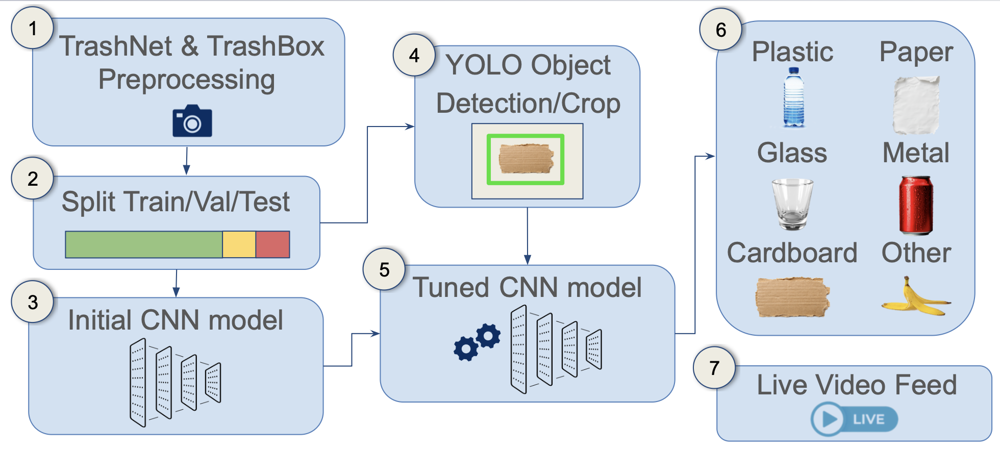

**1. TrashNet and TrashBox Preprocessing**

We used 2 main sources of data to train our trash classification model: TrashNet and TrashBox. TrashNet is a dataset of 2,527 images of trash separated out into 6 classes: cardboard, glass, metal, paper, plastic, trash [2]. Trashbox is another dataset of 14,282 images spearated into 7 classes: cardboard, e-waste, glass, medical, metal, paper, and plastic [3]. These images were consolidated into 6 desired classes of our liking: plastic, paper, cardboard, metal, glass, and other.


**2. Data Split**

We used a 70% training, 15% validation, and 15% test dataset of the combined TrashNet and TrashBox data to build our model.


**3. Initial CNN Model**

An initial CNN model using transfer learning from MobileNet V3 was trained on the 70% training split to be more tailored to trash-related features for our classes.


**4. YOLO Object Detection/Crop**

Because our model will be integrated with a live video feed, our model must be able to detect when objects are within the frame and crop them. Therefore, we used YOLO (yolov8n specifically) to detect and crop the images of trash in the frames.


**5. Tuned CNN Model**

For improved model performance, we conducted hyperparameter sweeps using Optuna. Optuna was used over GridSearch because it uses smart, adaptive sampling to explore the hyperparameter space, while focussing on the most promising regions and skipping poor trials early to save computation [4]. The sweeps explore hyperaparameters including learning rate, weight decay, and dropout using a small number of epochs and evaluated with macro F1 on the validation set.

Two different trials of Optuna hyperparameters were ran: the first on un-cropped images then was subsequently fine-tuned on cropped images, and the other on only cropped images from the base model.


**6. Class Predictions**

Once our model was fully trained, fine-tuned and we were happy with the results on the validation set, the model was tested on the test set. The model successfully predicts 6 classes of recycling based on image data.


**7. Live Video Feed Integration**

The model was lastly integrated with a live video feed. Because the goal is to be able to do live classification for sorting facilities, we proved that this could be done using webcam footage on a mock conveyer belt.


## Setup

In [11]:
# set global directory
global_path = '/content/drive/MyDrive/MIE1517 Group Project'
first_run = False # set to True if it is the first time running

In [1]:
!pip install optuna --quiet # install optuna

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 404.7/404.7 kB 7.5 MB/s eta 0:00:00


In [2]:
!pip install ultralytics --quiet # install yolo

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.8 MB/s eta 0:00:00


In [7]:
# imports
from google.colab import drive
import os, glob, cv2, pandas as pd
from sklearn.model_selection import train_test_split
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models
from PIL import Image
import pandas as pd
import shutil
import torch, torch.nn as nn, torch.optim as optim
from sklearn.metrics import f1_score, classification_report
from tqdm import tqdm
from sklearn.utils.class_weight import compute_class_weight
# import optuna
import warnings
from PIL import UnidentifiedImageError
import numpy as np
from datetime import datetime
# from ultralytics import YOLO
import matplotlib.pyplot as plt
import cv2
import json
import pickle

# suppress warnings for HTML output
warnings.filterwarnings("ignore", category=UserWarning, module="PIL.Image")
warnings.filterwarnings("ignore", message=".*can only test a child process.*")

In [8]:
def get_timestamp():

  """
  Function to calculate the current timestamp in the format YYYY-MM-DD_HH-MM-SS
  """

  now = datetime.now()
  formatted = now.strftime("%Y-%m-%d_%H-%M-%S")
  return formatted

In [5]:
drive.mount('/content/drive') # mount to drive

Mounted at /content/drive


In [6]:
%cd '/content/drive/MyDrive/MIE1517 Group Project'

/content/drive/.shortcut-targets-by-id/1nuYOWDejDNrYR27_mtTMUnHYOJHBoj4P/MIE1517 Group Project


In [ ]:
# make directories for trashbox and trashnet images

os.makedirs(f"{global_path}/raw/trashbox", exist_ok=True)
os.makedirs(f"{global_path}/raw/trashnet", exist_ok=True)

### Move Zips to SSD

In [9]:
shutil.move(
    "/content/drive/MyDrive/MIE1517 Group Project/trashbox.zip",
    "/content/trashbox.zip"

)

'/content/trashbox.zip'

In [10]:
shutil.move(
    "/content/drive/MyDrive/MIE1517 Group Project/trashnet.zip",
    "/content/trashnet.zip"

)

'/content/trashnet.zip'

##### unzip

In [11]:
!unzip -q "/content/trashbox.zip" -d "/content/trashbox/"
!unzip -q "/content/trashnet.zip" -d "/content/trashnet/"

## Consolidating Classes and Saving Train/Val/Test Split

## Workflow = Train CNN -> Use YOLO -> finetune CNN on YOLO images

### Consolidating image paths and labels

In [ ]:
if first_run:

  print("Running setup for the first time...")

  # define paths of TrashBox and TrashNet datasets
  raw_dirs = ['/content/trashbox/TrashBox_train_set', '/content/trashnet/dataset-resized']

  # define recyclable classes explicitly
  recycle_classes = {'cardboard', 'paper', 'glass', 'metal', 'plastic'}

  # collect image paths and assign consolidated labels
  rows = []
  for root_dir in raw_dirs: # loop through each dataset
    for cls in os.listdir(root_dir): # loop through each class folder inside the dataset
      full_path = os.path.join(root_dir, cls) # create the full path for each class
      if not os.path.isdir(full_path):
        continue
      label = cls if cls in recycle_classes else 'other' # label classes not in our desired classes as other
      # get all the images inside the folder
      images = glob.glob(os.path.join(full_path, '**', '*.jpg'), recursive=True) + \
                glob.glob(os.path.join(full_path, '**', '*.png'), recursive=True)
      for img in images: # loop through each image in the folder
        rows.append({'filepath': img, 'label': label}) # add each image path to the list and its label

  df = pd.DataFrame(rows)
  print(f"Total images found: {len(df)}")
  print("Unique labels found:", sorted(df['label'].unique()))


else:

  print("Skipping setup, already initialized.")

Skipping setup, already initialized.


### Saving Train/Val/Test Images

In [ ]:
# saving the train, val, and test csv's to the processed folder in Google Drive

if first_run:

  print("Running setup for the first time...")

  # stratified split (70/15/15) for train, validation, and test
  # set random state for reproducible results
  train_df, temp_df = train_test_split(df, test_size=0.3, stratify=df.label, random_state=42)
  val_df, test_df = train_test_split(temp_df, test_size=0.5, stratify=temp_df.label, random_state=42)

  # save processed .csv for train, validation, and test sets
  os.makedirs(f'{global_path}/processed', exist_ok=True)
  train_df.to_csv(f'{global_path}/processed/train.csv', index=False)
  val_df.to_csv(f'{global_path}/processed/val.csv', index=False)
  test_df.to_csv(f'{global_path}/processed/test.csv', index=False)

  # for each split, print the number of samples per each class to check balance
  for name, subset in [('train',train_df),('val',val_df),('test',test_df)]:
    counts = subset['label'].value_counts().to_dict()
    print(f"{name.upper()} distribution:", counts)

  print("\n Final 6-class setup: cardboard, paper, glass, metal, plastic, other")

else:

  print("Skipping setup, already initialized.")

Skipping setup, already initialized.


### Cropping Images with YOLO

In [12]:
# path where processed splits of train, validation, and test were saved
split_dir = f"{global_path}/processed"

# read the saved .csv files
train_df = pd.read_csv(f"{split_dir}/train.csv")
val_df   = pd.read_csv(f"{split_dir}/val.csv")
test_df  = pd.read_csv(f"{split_dir}/test.csv")

In [ ]:
def crop_with_yolo(df, subset_name, model_path='yolov8n.pt'):

  print(f"\n Cropping {subset_name} set...")
  yolo = YOLO(model_path) # define the YOLO model for cropping use

  out_dir = f"/content/cropped_images/{subset_name}" # define directory to save cropped images
  os.makedirs(out_dir, exist_ok=True)

  cropped_rows = []

  for img_path, label in zip(df['filepath'], df['label']): # loop through the images

    try:
      results = yolo.predict(source=img_path, verbose=False) # run object detection and return bounding boxes
      boxes = results[0].boxes.xyxy.cpu().numpy() if results and results[0].boxes else [] # extract the bounding boxes
      if len(boxes) == 0: # skip images if there are no detections
        continue
      img = cv2.imread(img_path) # load the image

      for i, (x1, y1, x2, y2) in enumerate(boxes): # loop through each of the detection boxes (one image can have multiple object detections)
        crop = img[int(y1):int(y2), int(x1):int(x2)] # crop the image to the bounding box specifications
        if crop.size == 0: # skip invalid crops
          continue

        # create name and save cropped image in list
        crop_name = f"{os.path.splitext(os.path.basename(img_path))[0]}_crop{i}.jpg"
        crop_path = os.path.join(out_dir, crop_name)
        cv2.imwrite(crop_path, crop)
        cropped_rows.append({'filepath': crop_path, 'label': label})


    except Exception as e:

      print(f" Skipping {img_path} due to: {e}")


In [ ]:
  # save the new cropped image dataset as a .csv
  out_csv = f"{global_path}/processed/{subset_name}_cropped.csv"
  pd.DataFrame(cropped_rows).to_csv(out_csv, index=False)
  print(f" {subset_name} cropped set saved: {out_csv}")
  print(f" Total cropped images: {len(cropped_rows)}")

In [ ]:
# running YOLO object detection on training, validation, and test datasets

if first_run:

  print("Running setup for the first time...")
  crop_with_yolo(train_df, "train") # run YOLO on train
  crop_with_yolo(val_df, "val") # run YOLO on validation
  crop_with_yolo(test_df, "test") # run YOLO on test

else:

  print("Skipping setup, already initialized.")

Skipping setup, already initialized.


In [ ]:
if first_run:
  !zip -r "/content/cropped_images.zip" "/content/cropped_images" # zip the cropped images for future use

else:
  print("Skipping setup, already initialized.")

Skipping setup, already initialized.


In [12]:
shutil.move(
    "/content/drive/MyDrive/MIE1517 Group Project/cropped_images.zip",
    "/content/cropped_images.zip"

)

'/content/cropped_images.zip'

In [13]:
!unzip -q "/content/cropped_images.zip" -d "/content/cropped_images/"

In [ ]:
def fix_crop_paths(split_name, base_path="/content/cropped_images", global_path="/content"):

  """
  Fixes filepaths in YOLO-cropped .csvs by prepending the correct base directory.

  Args:
    split_name (str): One of 'train', 'val', or 'test'.
    base_path (str): Path prefix to add before each cropped image filepath.
    global_path (str): Root path where processed CSVs are stored.

  Returns:
    pd.DataFrame: DataFrame with corrected filepaths.
  """

  input_csv = f"{global_path}/processed/{split_name}_cropped.csv"
  output_csv = f"{global_path}/processed/{split_name}_cropped.csv"

  if not os.path.exists(input_csv):
    print(f"File not found: {input_csv}")
    return None

  df = pd.read_csv(input_csv)
  df['filepath'] = df['filepath'].apply(lambda x: os.path.join(base_path, x.lstrip('/')))
  df.to_csv(output_csv, index=False)

  print(f"Fixed {split_name} paths and saved to: {output_csv}")
  return df


In [ ]:
if first_run: # fixing the file paths based on the zip and unzip of files
  print("Running setup for the first time...")
  train_crops = fix_crop_paths('train', base_path="/content/cropped_images", global_path=global_path)
  val_crops   = fix_crop_paths('val', base_path="/content/cropped_images", global_path=global_path)
  test_crops  = fix_crop_paths('test', base_path="/content/cropped_images", global_path=global_path)

else:
  print("Skipping setup, already initialized.")

Skipping setup, already initialized.


## Processing Data

### Load Data, Helper Functions

In [15]:
# define paths and set device
os.makedirs(f'{global_path}/experiments/classifier', exist_ok=True)
os.makedirs(f'{global_path}/experiments/optuna', exist_ok=True)
train_csv = f'{global_path}/processed/train.csv'
val_csv   = f'{global_path}/processed/val.csv'
test_csv  = f'{global_path}/processed/test.csv'

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print("Device:", device)

Device: cpu


In [16]:
# dataset and data loader utilities

class WasteDataset(Dataset):
  def __init__(self, csv_path, transform=None):
    # loading the csv file, preparing labels, and build and index mapping for the classes
    self.df = pd.read_csv(csv_path)
    self.transform = transform
    self.classes = sorted(self.df['label'].unique())
    self.class_to_idx = {c: i for i, c in enumerate(self.classes)}

  def __len__(self):
    return len(self.df) # length of dataframe

  def __getitem__(self, idx):
    # load an image and get the image path and label
    row = self.df.iloc[idx]
    filepath = row.filepath
    try:
      img = Image.open(filepath).convert("RGB") # open and convert image to RGB
    except (UnidentifiedImageError, OSError): # skip corrupt images
      print(f"Skipping corrupted file: {filepath}")
      # randomly choose another valid image to keep batch size consistent
      return self.__getitem__(np.random.randint(0, len(self.df)))
    # data augmentation step from the transform
    if self.transform:
      img = self.transform(img)
    label = self.class_to_idx[row.label] # converts string label to integer label
    return img, label


IMG_SIZE = 224
# data augmentation happens on the training set
train_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)), # resize to the desired 224x224 format
    transforms.RandomHorizontalFlip(), # ranomly flip horizontally
    transforms.ColorJitter(0.1,0.1,0.1,0.05), # random colour variations of brightness, contrast, saturation, and hue
    transforms.RandomRotation(10), # random rotation between -10 and 10 degrees
    transforms.RandomAffine(degrees=0, translate=(0.05,0.05), scale=(0.9,1.1)), # random affine transformation - translate up to 5% horizontal/vertical shift, scale zoom in or out between 90-110%
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) # normalizes each RGB chanel
])

val_tf = transforms.Compose([
    transforms.Resize((IMG_SIZE, IMG_SIZE)), # resize to the desired 224x224 format
    transforms.ToTensor(),
    transforms.Normalize([0.485,0.456,0.406],[0.229,0.224,0.225]) # same normalization as in the training set
])

def make_loaders(batch_size=64):

  # creates the training, validation and test sets
  train_ds = WasteDataset(train_csv, transform=train_tf)
  val_ds   = WasteDataset(val_csv, transform=val_tf)
  test_ds  = WasteDataset(test_csv, transform=val_tf)

  # uses the data loader to create the train, validation, and test set DataLoader wrap
  train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2)
  val_dl   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=2)
  test_dl  = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=2)
  return train_ds, val_ds, test_ds, train_dl, val_dl, test_dl

train_ds, val_ds, test_ds, train_dl, val_dl, test_dl = make_loaders() # call above function to make the data loader sets

In [18]:
# compute class weights once

# load in the training dataset and convert the string class labels to indices
labels_np = pd.read_csv(train_csv)['label'].map({c:i for i,c in enumerate(train_ds.classes)}).to_numpy()

# compute balanced class weights so that rare classes have higher weights, and frequent classes have lower weights
# this addresses if there are any class imbalances by multiplying the loss of each class by the weight factor per that class
cls_weights = torch.tensor(
    compute_class_weight('balanced', classes=np.arange(len(train_ds.classes)), y=labels_np),
    dtype=torch.float32
).to(device)

In [17]:
# Model Utlity

def make_model(num_classes, dropout=0.0, freeze_backbone=False):

  # load in the pre-trained model MobileNetV3-Large that was trained on ImageNet data
  model = models.mobilenet_v3_large(weights=models.MobileNet_V3_Large_Weights.IMAGENET1K_V2)

  # replace the classifier with a dropout layer and a linear layer classifier for the number of classes we desire
  model.classifier[-1] = nn.Sequential(
      nn.Dropout(dropout),
      nn.Linear(model.classifier[-1].in_features, num_classes)
  )

  # if freeze_backbone is set as True, then CNN convolution filters are not updated, only the classifier is trained
  if freeze_backbone:
    for p in model.features.parameters(): p.requires_grad = False

  return model.to(device)


# Training Function

def train_model(model, optimizer, scheduler, criterion, train_dl, val_dl, epochs=10, patience=5, save_path=None, params=None):

  best_f1, no_improve = 0, 0 # to store the best F1 and how many epochs there are without improvement to allow early stopping

  for epoch in range(1, epochs+1): # looping through epochs
    model.train(); train_loss=0

    # loading the batches, zero previous gradients, forward pass, compute loss, back propagation, update weights, calculate loss
    for x,y in tqdm(train_dl, desc=f"Epoch {epoch}/{epochs}"):
      x,y=x.to(device),y.to(device)
      optimizer.zero_grad()
      out=model(x); loss=criterion(out,y)
      loss.backward(); optimizer.step()
      train_loss += loss.item()*x.size(0)
    scheduler.step()

    # use the validation set to see if current epoch of model is improving
    model.eval(); preds,gts=[],[]
    with torch.no_grad():
      for x,y in val_dl:
        x=x.to(device)
        preds.extend(model(x).argmax(1).cpu().numpy())
        gts.extend(y.numpy())
    val_f1=f1_score(gts,preds,average='macro') # calculate F1 score of epoch on validation set
    print(f"Epoch {epoch}: val_F1={val_f1:.4f}")

    # if the validation F1 is improving, then keep going
    if val_f1>best_f1:
      best_f1,val_loss=val_f1,train_loss/len(train_dl.dataset)
      no_improve=0 # reset - model improved so don't add to this, which checks how many epochs the model has not improved
      if save_path: # save the model specifics
        torch.save({'state_dict':model.state_dict(),'classes':train_ds.classes, 'best_params': params},save_path)
        print(f"Saved new best model ({best_f1:.4f})")

    # if the model is not improving, then stop training loop
    else:
      no_improve+=1
      if no_improve>=patience: print("Early stop."); break

  return best_f1

In [ ]:

# def train_model(model, optimizer, scheduler, criterion, train_dl, val_dl,
#                 epochs=10, patience=5, save_path=None, params=None):

#     best_f1, no_improve = 0, 0

#     for epoch in range(1, epochs+1):
#         model.train()
#         train_loss = 0

#         # ---- TRAIN LOOP ----
#         for x, y in tqdm(train_dl, desc=f"Epoch {epoch}/{epochs}"):
#             x, y = x.to(device), y.to(device)
#             optimizer.zero_grad()
#             out = model(x)
#             loss = criterion(out, y)
#             loss.backward()
#             optimizer.step()
#             train_loss += loss.item() * x.size(0)

#         scheduler.step()

#         # ---- VALIDATION ----
#         model.eval()
#         preds, gts = [], []
#         with torch.no_grad():
#             for x, y in val_dl:
#                 x = x.to(device)
#                 logits = model(x)
#                 preds.extend(logits.argmax(1).cpu().numpy())
#                 gts.extend(y.numpy())

#         # ---- METRICS ----
#         val_f1 = f1_score(gts, preds, average='macro')
#         val_acc = accuracy_score(gts, preds)
#         val_precision = precision_score(gts, preds, average='macro', zero_division=0)
#         val_recall = recall_score(gts, preds, average='macro', zero_division=0)

#         print(f"Epoch {epoch}: "
#               f"Acc={val_acc:.4f} | "
#               f"Precision={val_precision:.4f} | "
#               f"Recall={val_recall:.4f} | "
#               f"F1={val_f1:.4f}")

#         # ---- EARLY STOP CHECK ----
#         if val_f1 > best_f1:
#             best_f1 = val_f1
#             no_improve = 0

#             if save_path:
#                 torch.save({
#                     'state_dict': model.state_dict(),
#                     'classes': train_ds.classes,
#                     'best_params': params
#                 }, save_path)
#                 print(f"Saved new best model (F1={best_f1:.4f})")

#         else:
#             no_improve += 1
#             if no_improve >= patience:
#                 print("Early stop.")
#                 break

#     return best_f1


### Stuff to Add into the project main screen

In [19]:
#EDA

In [33]:
def visualize_samples(df, samples_per_class=4, img_size=128):
  # get all unique classes
  classes = sorted(df["label"].unique())
  n_classes = len(classes)
  # make a small figure so it fits on screen
  fig, axes = plt.subplots(n_classes, samples_per_class,
                          figsize=(samples_per_class * 2, n_classes * 2))

  # make axes always indexable
  if n_classes == 1:
    axes = [axes]
  # loop over classes
  for i, cls in enumerate(classes):
    subset = df[df["label"] == cls]
  # randomly pick samples
  chosen = subset.sample(min(samples_per_class, len(subset)), random_state=42)
  # loop through chosen images
  for j, (_, row) in enumerate(chosen.iterrows()):
    img = Image.open(row["filepath"]).convert("RGB")
    img = img.resize((img_size, img_size), Image.LANCZOS)
    ax = axes[i][j] if samples_per_class > 1 else axes[i]
    ax.imshow(img)
    ax.set_title(str(cls), fontsize=8, pad=2)
    ax.set_xticks([])
    ax.set_yticks([])

    # remove borders
    for side in ax.spines:
      ax.spines[side].set_visible(False)
  plt.tight_layout(pad=0.5)
  plt.show()

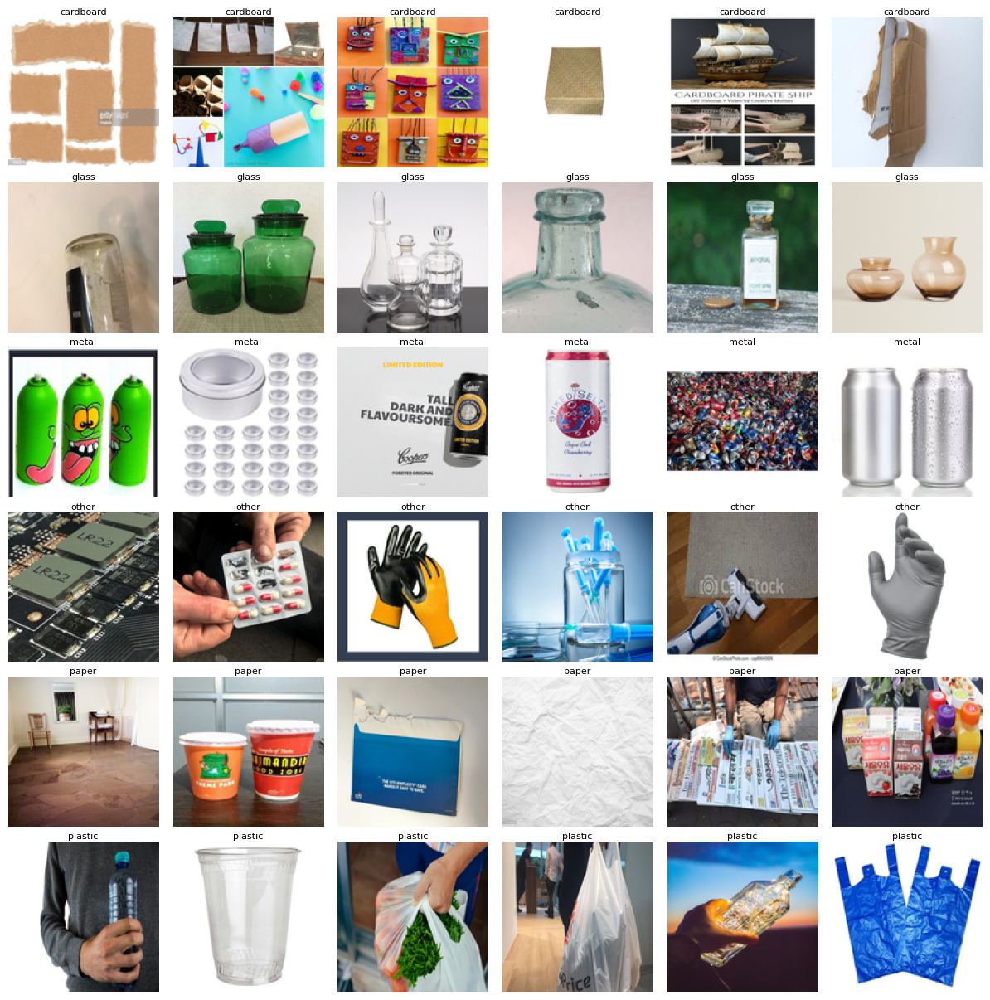

In [34]:
visualize_from_csv_small(train_df, samples_per_class=6, img_size=128)


In [38]:
def plot_class_distribution(train_df, val_df, test_df):

 # count labels
 train_counts = train_df["label"].value_counts().sort_index()
 val_counts   = val_df["label"].value_counts().sort_index()
 test_counts  = test_df["label"].value_counts().sort_index()

 classes = sorted(train_counts.index)
 x = np.arange(len(classes))
 width = 0.25

 # class distribution by split
 plt.figure(figsize=(8,5))

 plt.bar(x - width, train_counts.values, width=width, label="train")
 plt.bar(x, val_counts.values, width=width, label="val")
 plt.bar(x + width, test_counts.values, width=width, label="test")

 plt.xticks(x, classes)
 plt.title("Class Distribution by Split", fontsize=12)
 plt.xlabel("Class")
 plt.ylabel("Count")
 plt.legend()
 plt.tight_layout()
 plt.show()


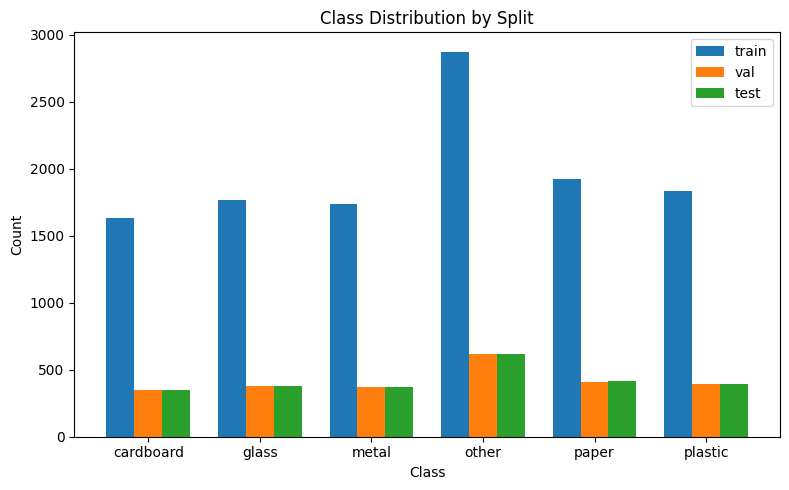

In [39]:
plot_class_distribution(train_df, val_df, test_df)


In [ ]:
# for yolo section

In [40]:
train_crops = pd.read_csv(f"{global_path}/processed/train_cropped.csv") # load train cropped images
val_crops   = pd.read_csv(f"{global_path}/processed/val_cropped.csv") # load validation cropped images

In [46]:
def show_yolo_pairs(orig_df, crop_df, n_samples=5, img_size=200):

 # make a copy so we don't mess with original dataframe
 df = orig_df.copy()

 shown = 0

 # loop until we have shown n_samples valid pairs
 while shown < n_samples:

  # sample 1 at a time
  row = df.sample(1, random_state=None).iloc[0]
  orig_path = row["filepath"]
  orig_name = os.path.basename(orig_path)
  orig_stem = orig_name.rsplit('.', 1)[0]   # ex: "paper 1145"

  # find matching crop(s)
  match = crop_df[crop_df["filepath"].str.contains(orig_stem + "_crop", regex=False)]

  # skip if none found
  if len(match) == 0:
   df = df[df["filepath"] != orig_path]  # remove so we don't re-sample same file
   continue

  # found a match → proceed
  crop_path = match.iloc[0]["filepath"]

  # load images
  orig = Image.open(orig_path).convert("RGB")
  crop = Image.open(crop_path).convert("RGB")

  orig = orig.resize((img_size, img_size), Image.LANCZOS)
  crop = crop.resize((img_size, img_size), Image.LANCZOS)

  # plot
  fig, axes = plt.subplots(1, 2, figsize=(5,3))

  axes[0].imshow(orig)
  axes[0].set_title("Original", fontsize=10)
  axes[0].set_xticks([]); axes[0].set_yticks([])

  axes[1].imshow(crop)
  axes[1].set_title("YOLO Crop", fontsize=10)
  axes[1].set_xticks([]); axes[1].set_yticks([])

  for ax in axes:
   for side in ax.spines:
    ax.spines[side].set_visible(False)

  plt.tight_layout()
  plt.show()

  shown += 1
  df = df[df["filepath"] != orig_path]  # remove so it's not sampled again


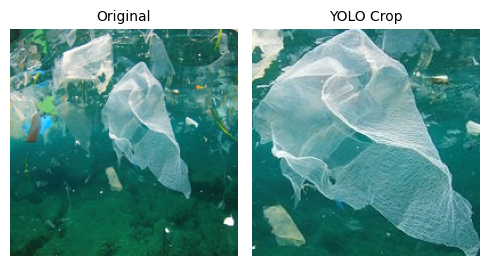

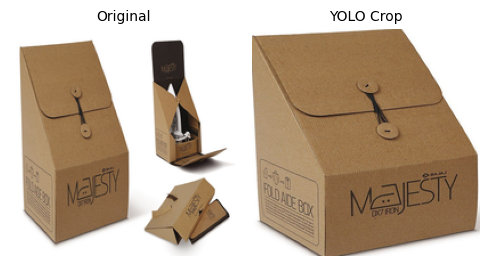

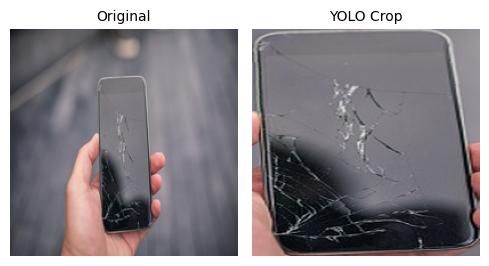

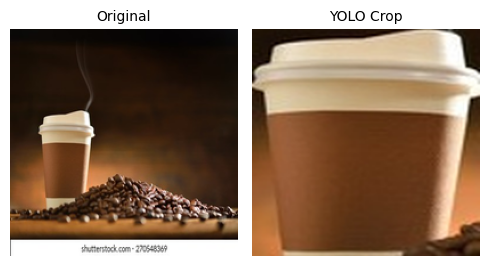

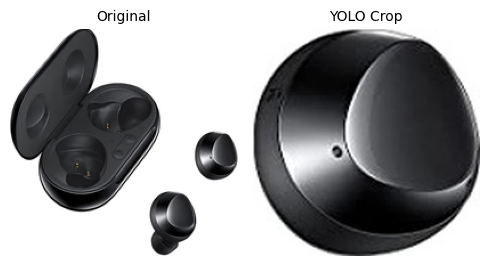

In [48]:
show_yolo_pairs(train_df, train_crops, n_samples=5, img_size=200)


In [ ]:
#fix under the first model

The above figure shows how the training and validation loss and accuracy change over nine epochs. Both loss curves steadily decrease, with training loss leveling off around 0.41 and validation loss around 0.44. Their close alignment suggests the model is learning reliably without early signs of overfitting.
The accuracy curves follow the same pattern. Training accuracy increases from about 0.68 to 0.86, while validation accuracy tracks closely, rising from 0.80 to 0.85. The small gap between them indicates good generalization. Overall, the model trains smoothly, converges consistently, and remains stable. These results provide a strong baseline for the next steps, such as hyperparameter tuning.

In [ ]:
# figure out qualitative samples

In [49]:
def predict_single_image(img_path,
                         yolo_model_path="yolov8n.pt",
                         cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
                         global_path="/content",
                         device='cuda' if torch.cuda.is_available() else 'cpu'):
  """
  Runs YOLO detection + CNN classification on a single image.
  Args:
      img_path (str): Path to the image to analyze.
      yolo_model_path (str): Path to YOLO model weights.
      cnn_checkpoint_name (str): Name of fine-tuned CNN checkpoint file.
      global_path (str): Root directory containing experiments/classifier folder.
      device (str): 'cuda' or 'cpu'.
  """
  print(f"\n Processing: {img_path}")

  # load YOLO model
  yolo = YOLO(yolo_model_path) #initialize yolo model
  results = yolo.predict(source=img_path, verbose=False) # run yolo inference
  boxes = results[0].boxes.xyxy.cpu().numpy() if results and results[0].boxes else [] #extract bounding boxes

  # load image
  img = cv2.imread(img_path)
  if img is None: # handle cases where the image fails to load
    print("Could not read image.")
    return
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert to RGB

  # handle no detections
  if len(boxes) == 0:
    print("No objects detected.")
    return

  print(f"Detected {len(boxes)} object(s).")
  crops = []
  for i, (x1, y1, x2, y2) in enumerate(boxes):
    crop = img[int(y1):int(y2), int(x1):int(x2)] # extract bounding box region
    if crop.size == 0: # skip invalid crops
      continue
    crop_path = f"/content/temp_crop_{i}.jpg"
    cv2.imwrite(crop_path, crop)
    crops.append(crop_path)

  # load CNN model (fine-tuned classifier)
  model_path = f"{global_path}/experiments/optuna/{cnn_checkpoint_name}.pt" # model path
  ckpt = torch.load(model_path, map_location=device) # load checkpoint
  model = make_model(len(ckpt['classes'])) # recreate model architecture
  model.load_state_dict(ckpt['state_dict']) # load trained weights
  model.to(device).eval() #move to device

  idx_to_class = {i: c for i, c in enumerate(ckpt['classes'])}

  # define same transform used during validation
  IMG_SIZE = 224
  val_tf = transforms.Compose([
      transforms.Resize((IMG_SIZE, IMG_SIZE)),
      transforms.ToTensor(),
      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
  ])

  # classify each crop
  print("\n Classification Results:")
  predictions = []
  for crop_path in crops:
    crop_img = Image.open(crop_path).convert("RGB")
    x = val_tf(crop_img).unsqueeze(0).to(device) # apply transforms and add batch dimension

    with torch.no_grad(): # disable gradients for inference
      output = model(x) # forward pass
      pred_idx = output.argmax(1).item() # get class index with highest logit
      pred_class = idx_to_class[pred_idx] # map index to class name
      conf = torch.softmax(output, dim=1)[0, pred_idx].item() # compute confidence score

    predictions.append((crop_path, pred_class, conf))
    print(f"  • {os.path.basename(crop_path)} → {pred_class} ({conf:.3f})")

  # visualization
  for crop_path, pred_class, conf in predictions:
    img = Image.open(crop_path)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction: {pred_class} ({conf:.2f})")
    plt.show()

  print("Completed image analysis.")
  return predictions


In [ ]:
pred1 = predict_single_image(
    img_path="/content/test_images/IMG_9515.jpeg",
    yolo_model_path="yolov8n.pt",
    cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
    global_path=global_path
) #plastic water bottle


In [ ]:
## add for demos below

## **Live Demo**

This project includes two separate demos that show how YOLOv8 and MobileNetV3 work together for real-time and video-based trash classification. To try them yourself, simply download the project ZIP file, extract it, and follow the instructions in each demo’s README section. Each demo also includes a recording showing the system running in real time.

#### Helper Function to Show Inline Video

In [ ]:
from IPython.display import HTML
import warnings
warnings.filterwarnings("ignore", message="Consider using IPython.display.IFrame instead")

In [ ]:
def show_video(url, width="70%", aspect=0.5625):
    return HTML(f"""
    <div style="display: flex; justify-content: center; width: 100%;">
        <div style="position: relative; width: {width}; padding-bottom: {aspect*100}%;">
            <iframe src="{url}"
                    style="position: absolute; top:0; left:0; width:100%; height:100%; border:0;"
                    allow="autoplay"
                    allowfullscreen>
            </iframe>
        </div>
    </div>
    """)

### **Live Trash Detection (Webcam)**

This demo uses your computer’s webcam to detect and classify trash objects in real time. YOLO handles object detection, and MobileNetV3 predicts the trash category for each detected item. Once you download the project and install the environment, you can run the script and see classifications appear instantly on your live camera feed.

A short video demonstration is included below to show the live system in action:

In [ ]:
#insert demo video
embed_url = "https://drive.google.com/file/d/1e3Eu96fr62hwyv18g5Gu9iWlbb1fu_QP/preview"
show_video(embed_url)

### **Video Trash Detection (Stable Classification)**

This demo processes an existing video file instead of using a webcam. The system detects and classifies objects frame-by-frame, but also applies prediction smoothing to lock in a clean, stable final label—ideal for treadmill-style or continuous-motion videos. After downloading the project ZIP and extracting it, you can run the script to generate a new annotated output video.

A full example video is provided below to show the stabilized classification working on a real test clip:

In [ ]:
#insert demo video
embed_url = "https://drive.google.com/file/d/1e3Eu96fr62hwyv18g5Gu9iWlbb1fu_QP/preview"
show_video(embed_url)

#### break #####

### Initial Classifier Training

In [ ]:
# Baseline Model Training

timestamp = get_timestamp()
baseline_filename = f"best_{timestamp}" # set distinct filename for saving each time based on current timestamp

criterion = nn.CrossEntropyLoss(weight=cls_weights) # cross entropy loss for multi-class classification
model = make_model(len(train_ds.classes), dropout=0.0, freeze_backbone=True) # training model with no dropout and only train classifier head not convolution layers
optimizer = optim.AdamW(filter(lambda p: p.requires_grad, model.parameters()), lr=2e-4, weight_decay=1e-4) # set optimizer, ensure optimizer ignores frozen layers
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=30) # smooth cosine shaped learning rate decay, improves generalization, stabilizes training

print("Training baseline (frozen backbone)...")
baseline_f1 = train_model(model, optimizer, scheduler, criterion, train_dl, val_dl, epochs=10,
                          patience=7, save_path=f'{global_path}/experiments/classifier/{baseline_filename}.pt')
print(f'Best Val F1: {baseline_f1}')

Best Val F1: 0.8478


### Fine Tune Whole Model



In [ ]:
# Fine-tune whole model from loading in a saved baseline checkpoint -- have not run yet

# baseline_filename = #set baseline file name if in new session and just fine tuning
baseline_path = f'{global_path}/experiments/classifier/{baseline_filename}.pt' #baseline .pt file used
timestamp = get_timestamp()
finetuned_filename = f"best_finetuned_using_{baseline_filename}_{timestamp}" #set distinct filename including baseline model used

# reload model from .pt for fine tuning
ckpt = torch.load(baseline_path, map_location=device)
model = make_model(len(ckpt['classes']), dropout=0.0, freeze_backbone=False)
model.load_state_dict(ckpt['state_dict'])
model.to(device)

# Now fine-tune
for p in model.features.parameters():
  p.requires_grad = True

optimizer = optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
criterion = nn.CrossEntropyLoss(weight=cls_weights)

finetuned_path = f"{global_path}/experiments/classifier/{finetuned_filename}.pt"
fine_f1 = train_model(model, optimizer, scheduler, criterion,
                      train_dl, val_dl, epochs=10, patience=5,
                      save_path=finetuned_path)

### Hyperparamter Sweep

In [ ]:
# sweep with optuna -- have not run yet due to training time

timestamp = get_timestamp()
optuna_filename = f"best_optuna_{timestamp}" #set distinct filename

def objective(trial):
  lr = trial.suggest_loguniform('lr', 1e-5, 5e-4)
  wd = trial.suggest_loguniform('weight_decay', 1e-5, 1e-3)
  dropout = trial.suggest_uniform('dropout', 0.0, 0.4)
  model = make_model(len(train_ds.classes), dropout=dropout)
  criterion = nn.CrossEntropyLoss(weight=cls_weights)
  optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=wd)
  scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
  f1 = train_model(model, optimizer, scheduler, criterion, train_dl, val_dl, epochs=8, patience=3)
  return f1

study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10)
print("Best:", study.best_value, study.best_params)

# Retrain with best
bp = study.best_params
model = make_model(len(train_ds.classes), dropout=bp['dropout'])
criterion = nn.CrossEntropyLoss(weight=cls_weights)
optimizer = optim.AdamW(model.parameters(), lr=bp['lr'], weight_decay=bp['weight_decay'])
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=25)
best_f1 = train_model(model, optimizer, scheduler, criterion, train_dl, val_dl, epochs=25,
                      patience=7, save_path=f'{global_path}/experiments/optuna/{optuna_filename}.pt', params=bp)
print("Optuna best F1:", best_f1)

### Hyperparameter Sweep Results

In [ ]:
# Path to the summary file from the sweep
summary_path = f'{global_path}/experiments/optuna/summary_2025-11-22_10-48-50.json'

with open(summary_path, 'r') as f:
    summary = json.load(f)

print("Sweep Summary:")
print(f"Best F1: {summary['best_f1']:.4f}")
print(f"Best Params: {summary['best_params']}")



Sweep Summary:
Best F1: 0.9228
Best Params: {'lr': 0.00040169964662790686, 'weight_decay': 4.012484773952883e-05, 'dropout': 0.13205789386950112}


In [ ]:
# Load the study object
study_path = f'{global_path}/experiments/optuna/study_2025-11-22_10-48-50.pkl'  # Replace with actual timestamp
with open(study_path, 'rb') as f:
    study = pickle.load(f)

# Plot optimization history
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

# Plot parameter importance
fig2 = optuna.visualization.plot_param_importances(study)
fig2.show()

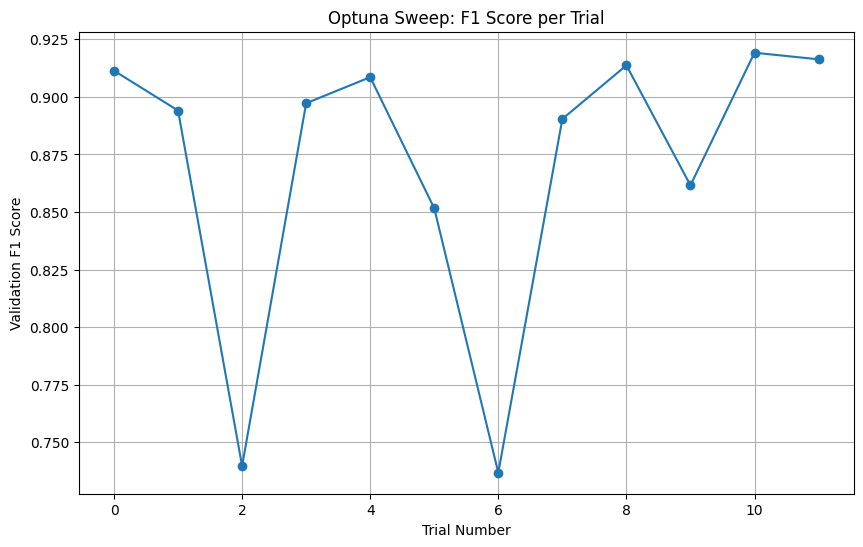

In [ ]:
# Load trials data
trials_path = f'{global_path}/experiments/optuna/trials_2025-11-22_10-48-50.json'
with open(trials_path, 'r') as f:
    trials = json.load(f)

# Plot F1 vs trial number
trial_nums = [t['number'] for t in trials]
f1_scores = [t['value'] for t in trials if t['value'] is not None]

plt.figure(figsize=(10, 6))
plt.plot(trial_nums[:len(f1_scores)], f1_scores, marker='o')
plt.xlabel('Trial Number')
plt.ylabel('Validation F1 Score')
plt.title('Optuna Sweep: F1 Score per Trial')
plt.grid(True)
plt.show()

### Fine Tune on YOLO images

In [ ]:
train_crops = pd.read_csv(f"{global_path}/processed/train_cropped.csv") # load train cropped images
val_crops   = pd.read_csv(f"{global_path}/processed/val_cropped.csv") # load validation cropped images


def show_yolo_pairs(orig_df, crop_df, n_samples=5, img_size=200):

 # randomly select originals
 samples = orig_df.sample(n_samples, random_state=42)

 # loop through selected examples
 for _, row in samples.iterrows():
  orig_path = row["filepath"]

  # find matching crop (expects crop_df has 'orig_path')
  match = crop_df[crop_df["orig_path"] == orig_path]

  if len(match) == 0:
   print("No crop found for:", orig_path)
   continue

  crop_path = match.iloc[0]["filepath"]

  # load both images
  orig = Image.open(orig_path).convert("RGB")
  crop = Image.open(crop_path).convert("RGB")

  # resize for clean visualization
  orig = orig.resize((img_size, img_size), Image.LANCZOS)
  crop = crop.resize((img_size, img_size), Image.LANCZOS)

  # make side-by-side plot
  fig, axes = plt.subplots(1, 2, figsize=(5,3))

  axes[0].imshow(orig)
  axes[0].set_title("Original", fontsize=10)
  axes[0].set_xticks([]); axes[0].set_yticks([])

  axes[1].imshow(crop)
  axes[1].set_title("YOLO Crop", fontsize=10)
  axes[1].set_xticks([]); axes[1].set_yticks([])

  for ax in axes:
   for side in ax.spines:
    ax.spines[side].set_visible(False)

  plt.tight_layout()
  plt.show()


In [ ]:
def make_loaders_cropped(batch_size=64, global_path=global_path):
  """
  Creates DataLoaders for YOLO-cropped datasets using the same WasteDataset class.
  """

  # get the paths of the train, validation, and test cropped csv files
  train_csv = f"{global_path}/processed/train_cropped.csv"
  val_csv   = f"{global_path}/processed/val_cropped.csv"
  test_csv  = f"{global_path}/processed/test_cropped.csv"

  # create datasets by applying the augmented and transformed images
  train_ds = WasteDataset(train_csv, transform=train_tf)
  val_ds   = WasteDataset(val_csv, transform=val_tf)
  test_ds  = WasteDataset(test_csv, transform=val_tf)

  # load the train, validation, and test cropped & transformed images into Data Loaders
  train_dl = DataLoader(train_ds, batch_size=batch_size, shuffle=True, num_workers=2)
  val_dl   = DataLoader(val_ds, batch_size=batch_size, shuffle=False, num_workers=2)
  test_dl  = DataLoader(test_ds, batch_size=batch_size, shuffle=False, num_workers=2)

  print(f"Loaded cropped datasets: {len(train_ds)} train, {len(val_ds)} val, {len(test_ds)} test samples.")
  return train_ds, val_ds, test_ds, train_dl, val_dl, test_dl

In [ ]:
train_ds_cropped, val_ds_cropped, test_ds_cropped, train_dl_cropped, val_dl_cropped, test_dl_cropped = make_loaders_cropped() # run the cropped loader function

Loaded cropped datasets: 18070 train, 3954 val, 3998 test samples.


In [ ]:
baseline_filename = 'best_2025-11-06_03-49-10' # name of the model for loading in
baseline_path = f'{global_path}/experiments/classifier/{baseline_filename}.pt' # file path of model loading
ckpt = torch.load(baseline_path, map_location=device) # load in the model
model = make_model(len(ckpt['classes']), dropout=0.0, freeze_backbone=False) # rebuild model with architecture defined above
model.load_state_dict(ckpt['state_dict']) # load model weights
model.to(device)

In [ ]:
# unfreeze backbone if it’s frozen
for p in model.features.parameters():
  p.requires_grad = True

# set the optimizer, scheduler, and criterion for fine-tuning the model with YOLO
optimizer = optim.AdamW(model.parameters(), lr=5e-5, weight_decay=1e-4)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10)
criterion = nn.CrossEntropyLoss(weight=cls_weights)

# save best fine-tuned model path for later predictions
timestamp = get_timestamp()
yolo_finetuned_filename = f"best_finetuned_yolo_{timestamp}"
fine_f1 = train_model(model, optimizer, scheduler, criterion,
                      train_dl_cropped, val_dl_cropped, epochs=8, patience=4,
                      save_path=f'{global_path}/experiments/classifier/{yolo_finetuned_filename}.pt')


Epoch 1/8: 100%|██████████| 283/283 [02:57<00:00,  1.59it/s]


Epoch 1: val_F1=0.7748
Saved new best model (0.7748)


Epoch 2/8: 100%|██████████| 283/283 [02:54<00:00,  1.62it/s]


Epoch 2: val_F1=0.7899
Saved new best model (0.7899)


Epoch 3/8: 100%|██████████| 283/283 [02:55<00:00,  1.61it/s]


Epoch 3: val_F1=0.7994
Saved new best model (0.7994)


Epoch 4/8: 100%|██████████| 283/283 [03:15<00:00,  1.45it/s]


Epoch 4: val_F1=0.8018
Saved new best model (0.8018)


Epoch 5/8: 100%|██████████| 283/283 [02:51<00:00,  1.65it/s]


Epoch 5: val_F1=0.8101
Saved new best model (0.8101)


Epoch 6/8: 100%|██████████| 283/283 [03:13<00:00,  1.47it/s]


Epoch 6: val_F1=0.8178
Saved new best model (0.8178)


Epoch 7/8: 100%|██████████| 283/283 [03:23<00:00,  1.39it/s]


Epoch 7: val_F1=0.8215
Saved new best model (0.8215)


Epoch 8/8: 100%|██████████| 283/283 [02:52<00:00,  1.64it/s]


Epoch 8: val_F1=0.8167


In [ ]:
def objective(trial, baseline_path):
  # hyperparameter search space
  lr = trial.suggest_loguniform('lr', 1e-5, 5e-4) # learning rate
  wd = trial.suggest_loguniform('weight_decay', 1e-5, 1e-3) # weight decay
  dropout = trial.suggest_uniform('dropout', 0.0, 0.4) # dropout rate

  # load best model checkpoint
  ckpt = torch.load(baseline_path, map_location=device)
  model = make_model(len(ckpt['classes']), dropout=dropout)
  model.load_state_dict(ckpt['state_dict'])
  model.to(device)

  for p in model.features.parameters():
    p.requires_grad = True # unfreeze backbone for fine-tuning

  criterion = nn.CrossEntropyLoss(weight=cls_weights) # define loss function (cross entropy)
  optimizer = optim.AdamW(model.parameters(), lr=lr, weight_decay=wd) # use AdamW optimizer with suggested learn rate and weigth decay
  scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=10) # apply cosine annealing learning rate

  f1 = train_model(model, optimizer, scheduler, criterion,
                    train_dl_cropped, val_dl_cropped, epochs=8, patience=3)
  return f1


In [ ]:
# run sweep with optuna - have not run this trial yet due to training time
baseline_path = f"{global_path}/experiments/classifier/{yolo_finetuned_filename}.pt"
study = optuna.create_study(direction='maximize')
study.optimize(lambda trial: objective(trial, baseline_path), n_trials=10)

### Testing *Not running until the end

#### Evaluate Model before YOLO crops

In [ ]:
from sklearn.metrics import f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns  # optional, remove if you prefer pure matplotlib

def evaluate(path, name, test_loader):
    # Load checkpoint
    ckpt = torch.load(path, map_location=device)

    # Rebuild model
    model = make_model(len(ckpt['classes']))
    model.load_state_dict(ckpt['state_dict'])
    model.to(device).eval()

    preds, gts = [], []

    with torch.no_grad():
        for x, y in test_loader:
            x = x.to(device)
            logits = model(x)
            preds.extend(logits.argmax(1).cpu().numpy())
            gts.extend(y.cpu().numpy())

    # Macro F1 score
    f1 = f1_score(gts, preds, average='macro')

    print(f"\n{name} Results (macro-F1 = {f1:.4f})")
    print(classification_report(gts, preds, target_names=ckpt['classes']))

    # ---- CONFUSION MATRIX ----
    cm = confusion_matrix(gts, preds)
    print("\nConfusion Matrix:")
    print(cm)

    # ---- OPTIONAL VISUALIZATION ----
    plt.figure(figsize=(8,6))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues",
                xticklabels=ckpt['classes'],
                yticklabels=ckpt['classes'])
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"{name} - Confusion Matrix")
    plt.tight_layout()
    plt.show()

    return f1


In [ ]:
def evaluate(path, name, test_loader):
  ckpt = torch.load(path, map_location=device) # load the model checkpoint from path
  model = make_model(len(ckpt['classes'])) # recreate the model archetrcture based on the number of classes saved in the checkpoint
  model.load_state_dict(ckpt['state_dict']) # load the saved weights into the model
  model.to(device).eval() # put the model in eval mode
  preds, gts = [], [] # initialize list to store pred and ground truths

  with torch.no_grad(): # disable gradient calculation for speed
    for x, y in test_loader: # loop through the test dataset loader
      x = x.to(device) # move to the device
      preds.extend(model(x).argmax(1).cpu().numpy()) # perform forward pass and get the class with the highest prediction probability
      gts.extend(y.numpy()) # append true labels

    f1 = f1_score(gts, preds, average='macro') # compute the macro-averaged F1 across clases
    print(f"\n{name} Results (macro-F1={f1:.4f})") # print result summary
    print(classification_report(gts, preds, target_names=ckpt['classes'])) # print classification metrics
    return f1 # return the f1 score

In [ ]:
finetuned_filename = 'best_optuna_2025-11-22_22-43-24_crop'
cm = evaluate(
    path=f"{global_path}/experiments/classifier/{finetuned_filename}.pt",
    name="Baseline Not Tuned",
    test_loader=test_dl
)

In [ ]:
#DO NOT RUN UNTIL END
finetuned_filename = 'best'
cm = evaluate(
    path=f"{global_path}/experiments/classifier/{finetuned_filename}.pt",
    name="Baseline Not Tuned",
    test_loader=test_dl
)

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 159MB/s]


Skipping corrupted file: /content/trashbox/TrashBox_train_set/e-waste/e-waste 1719.jpg

Baseline Not Tuned Results (macro-F1 = 0.8634)
              precision    recall  f1-score   support

   cardboard       0.85      0.90      0.88       350
       glass       0.84      0.87      0.86       378
       metal       0.90      0.89      0.90       371
       other       0.83      0.93      0.88       616
       paper       0.96      0.78      0.86       414
     plastic       0.84      0.79      0.81       393

    accuracy                           0.86      2522
   macro avg       0.87      0.86      0.86      2522
weighted avg       0.87      0.86      0.86      2522


Confusion Matrix:
[[316   4   4  21   2   3]
 [  6 330  14  11   2  15]
 [  4  13 331  14   3   6]
 [ 16  13   1 571   2  13]
 [ 19   4   6  42 323  20]
 [ 10  27  11  30   6 309]]


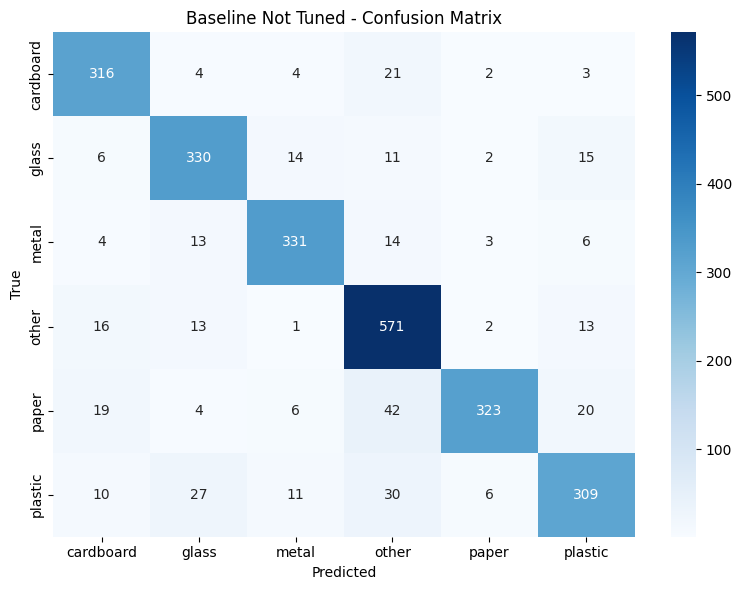

In [ ]:
finetuned_filename = 'best'
cm = evaluate(
    path=f"{global_path}/experiments/classifier/best_finetuned_yolo_2025-11-22_16-00-11.pt",
    name="Baseline Not Tuned",
    test_loader=test_dl
)

In [ ]:
baseline_eval = evaluate(f'{global_path}/experiments/classifier/best_finetuned.pt',"Baseline")
optuna_eval   = evaluate(f'{global_path}/experiments/optuna/best_model.pt',"Optuna Tuned")

print("\n🧾 Summary:")
print(f"Baseline F1: {baseline_eval:.4f}")
print(f"Tuned F1:    {optuna_eval:.4f}")
print(f"Improvement: {(optuna_eval-baseline_eval)*100:.2f}%")

#### Evaluate after YOLO crops

In [ ]:
# path to the saved fine-tuned model from YOLO cropping
# yolo_finetuned_filename = 'best_finetuned_yolo_2025-11-09_23-50-05'
yolo_finetuned_filename = 'best_finetuned_yolo_2025-11-22_16-00-11'
best_model_path = f"{global_path}/experiments/classifier/{yolo_finetuned_filename}.pt"
ckpt = torch.load(best_model_path, map_location=device)

# recreate model architecture and load in saved weights for predictions
model = make_model(len(ckpt['classes']), dropout=0.0, freeze_backbone=False)
model.load_state_dict(ckpt['state_dict'])
model.to(device)
model.eval()

print("Model loaded for testing:", best_model_path)

Model loaded for testing: /content/drive/MyDrive/MIE1517 Group Project/experiments/classifier/best_finetuned_yolo_2025-11-09_23-50-05.pt


In [ ]:
# obtaining the test set from the YOLO cropped images
test_csv = f"{global_path}/processed/test_cropped.csv" #set the directory for the csv with test img paths
test_ds  = WasteDataset(test_csv, transform=val_tf) #create a test dataset using the WasteDateset class - test_csv gives the img path and labels while val_tf resizes and normalizes images
test_dl  = DataLoader(test_ds, batch_size=64, shuffle=False, num_workers=2) #wrap dataset in a dataloader to load data in batches during eval

Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 120MB/s] 


Skipping corrupted file: /content/trashbox/TrashBox_train_set/e-waste/e-waste 1719.jpg

Baseline Not Tuned Results (macro-F1 = 0.8230)
              precision    recall  f1-score   support

   cardboard       0.87      0.85      0.86       350
       glass       0.88      0.74      0.80       378
       metal       0.82      0.83      0.83       372
       other       0.76      0.92      0.83       616
       paper       0.90      0.85      0.87       413
     plastic       0.78      0.72      0.75       393

    accuracy                           0.82      2522
   macro avg       0.84      0.82      0.82      2522
weighted avg       0.83      0.82      0.82      2522


Confusion Matrix:
[[296   5   7  23  14   5]
 [  5 279  20  40   2  32]
 [  8   8 309  30   7  10]
 [ 13   8  11 565   4  15]
 [ 11   3  11  23 349  16]
 [  8  13  18  61  12 281]]


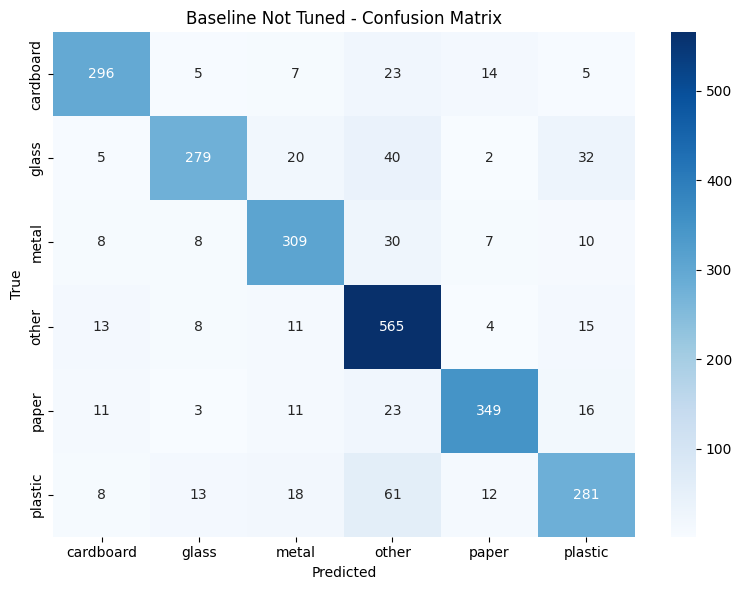

In [ ]:
finetuned_filename = 'best_optuna_2025-11-22_22-43-24_crop'
cm = evaluate(
    path=f"{global_path}/experiments/optuna/{finetuned_filename}.pt",
    name="Baseline Not Tuned",
    test_loader=test_dl
)


Baseline Not Tuned Results (macro-F1 = 0.8091)
              precision    recall  f1-score   support

   cardboard       0.75      0.81      0.78       298
       glass       0.89      0.87      0.88       922
       metal       0.80      0.89      0.85       665
       other       0.76      0.86      0.80       913
       paper       0.90      0.71      0.79       611
     plastic       0.80      0.71      0.75       589

    accuracy                           0.82      3998
   macro avg       0.82      0.81      0.81      3998
weighted avg       0.82      0.82      0.82      3998


Confusion Matrix:
[[240  10   8  22   9   9]
 [  8 801  30  49   5  29]
 [  4  10 594  46   2   9]
 [ 26  29  40 785  13  20]
 [ 25  17  32  70 432  35]
 [ 16  34  34  66  20 419]]


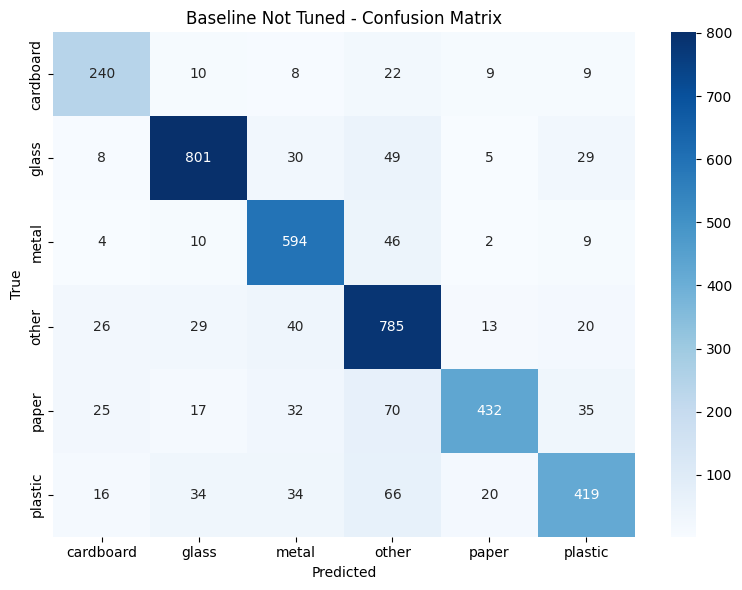

In [ ]:
finetuned_filename = 'best'
cm = evaluate(
    path=f"{global_path}/experiments/classifier/best_finetuned_yolo_2025-11-22_16-00-11.pt",
    name="Baseline Not Tuned",
    test_loader=test_dl_cropped
)


YOLO-Finetuned Results (macro-F1 = 0.8091)
              precision    recall  f1-score   support

   cardboard       0.75      0.81      0.78       298
       glass       0.89      0.87      0.88       922
       metal       0.80      0.89      0.85       665
       other       0.76      0.86      0.80       913
       paper       0.90      0.71      0.79       611
     plastic       0.80      0.71      0.75       589

    accuracy                           0.82      3998
   macro avg       0.82      0.81      0.81      3998
weighted avg       0.82      0.82      0.82      3998


Confusion Matrix:
[[240  10   8  22   9   9]
 [  8 801  30  49   5  29]
 [  4  10 594  46   2   9]
 [ 26  29  40 785  13  20]
 [ 25  17  32  70 432  35]
 [ 16  34  34  66  20 419]]


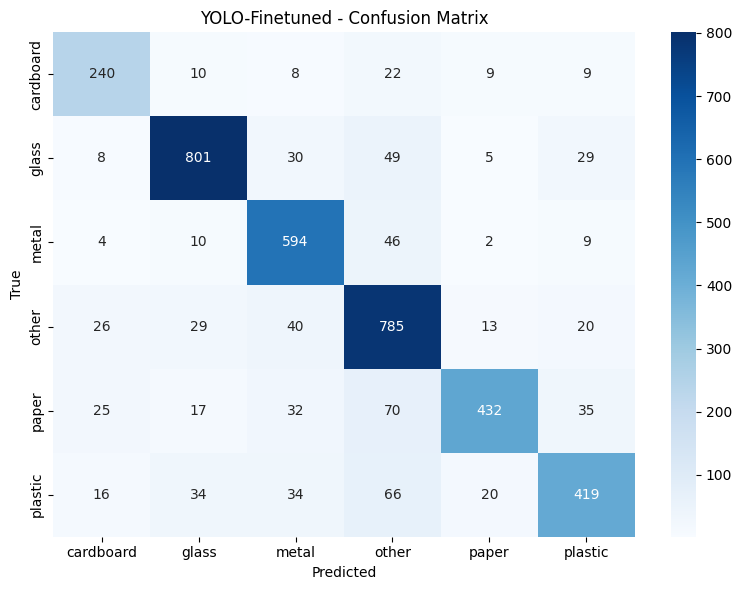

In [ ]:
#DO NOT RUN UNTIL END
# run evaluation on YOLO test set

cm = evaluate(
    path=f"{global_path}/experiments/classifier/{yolo_finetuned_filename}.pt",
    name="YOLO-Finetuned",
    test_loader=test_dl_cropped
)


YOLO-Finetuned Results (macro-F1 = 0.8137)
              precision    recall  f1-score   support

   cardboard       0.75      0.77      0.76       298
       glass       0.86      0.87      0.87       922
       metal       0.81      0.88      0.85       665
       other       0.84      0.81      0.82       913
       paper       0.81      0.82      0.82       611
     plastic       0.81      0.74      0.77       589

    accuracy                           0.82      3998
   macro avg       0.81      0.81      0.81      3998
weighted avg       0.82      0.82      0.82      3998


Confusion Matrix:
[[229  14   7  20  23   5]
 [  7 803  41  27  11  33]
 [  6  16 586  30  19   8]
 [ 29  39  38 741  41  25]
 [ 22  12  18  27 501  31]
 [ 12  48  31  42  22 434]]


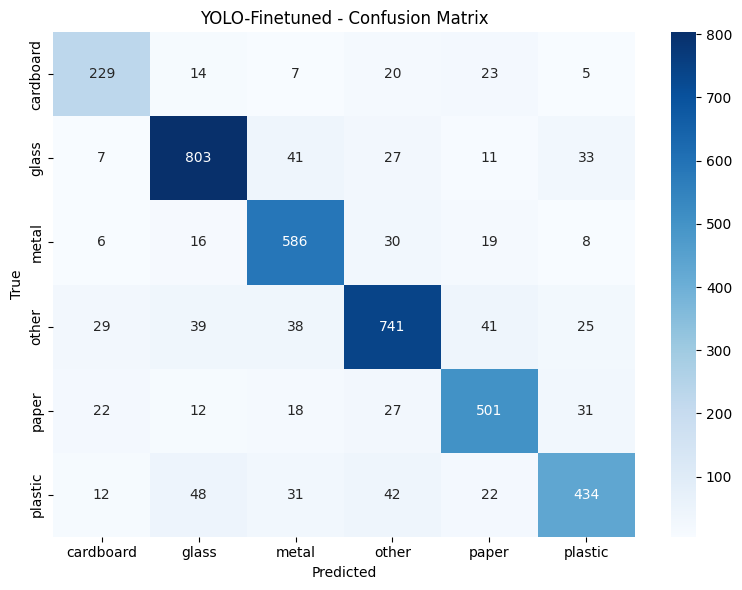

In [ ]:
# first model

cm = evaluate(
    path=f"{global_path}/experiments/classifier/{yolo_finetuned_filename}.pt",
    name="YOLO-Finetuned",
    test_loader=test_dl_cropped
)

#### Test on Images we Took as a Sanity Check

In [ ]:
def predict_single_image(img_path,
                         yolo_model_path="yolov8n.pt",
                         cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
                         global_path="/content",
                         device='cuda' if torch.cuda.is_available() else 'cpu'):
  """
  Runs YOLO detection + CNN classification on a single image.
  Args:
      img_path (str): Path to the image to analyze.
      yolo_model_path (str): Path to YOLO model weights.
      cnn_checkpoint_name (str): Name of fine-tuned CNN checkpoint file.
      global_path (str): Root directory containing experiments/classifier folder.
      device (str): 'cuda' or 'cpu'.
  """
  print(f"\n Processing: {img_path}")

  # load YOLO model
  yolo = YOLO(yolo_model_path) #initialize yolo model
  results = yolo.predict(source=img_path, verbose=False) # run yolo inference
  boxes = results[0].boxes.xyxy.cpu().numpy() if results and results[0].boxes else [] #extract bounding boxes

  # load image
  img = cv2.imread(img_path)
  if img is None: # handle cases where the image fails to load
    print("Could not read image.")
    return
  img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB) # convert to RGB

  # handle no detections
  if len(boxes) == 0:
    print("No objects detected.")
    return

  print(f"Detected {len(boxes)} object(s).")
  crops = []
  for i, (x1, y1, x2, y2) in enumerate(boxes):
    crop = img[int(y1):int(y2), int(x1):int(x2)] # extract bounding box region
    if crop.size == 0: # skip invalid crops
      continue
    crop_path = f"/content/temp_crop_{i}.jpg"
    cv2.imwrite(crop_path, crop)
    crops.append(crop_path)

  # load CNN model (fine-tuned classifier)
  model_path = f"{global_path}/experiments/optuna/{cnn_checkpoint_name}.pt" # model path
  ckpt = torch.load(model_path, map_location=device) # load checkpoint
  model = make_model(len(ckpt['classes'])) # recreate model architecture
  model.load_state_dict(ckpt['state_dict']) # load trained weights
  model.to(device).eval() #move to device

  idx_to_class = {i: c for i, c in enumerate(ckpt['classes'])}

  # define same transform used during validation
  IMG_SIZE = 224
  val_tf = transforms.Compose([
      transforms.Resize((IMG_SIZE, IMG_SIZE)),
      transforms.ToTensor(),
      transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
  ])

  # classify each crop
  print("\n Classification Results:")
  predictions = []
  for crop_path in crops:
    crop_img = Image.open(crop_path).convert("RGB")
    x = val_tf(crop_img).unsqueeze(0).to(device) # apply transforms and add batch dimension

    with torch.no_grad(): # disable gradients for inference
      output = model(x) # forward pass
      pred_idx = output.argmax(1).item() # get class index with highest logit
      pred_class = idx_to_class[pred_idx] # map index to class name
      conf = torch.softmax(output, dim=1)[0, pred_idx].item() # compute confidence score

    predictions.append((crop_path, pred_class, conf))
    print(f"  • {os.path.basename(crop_path)} → {pred_class} ({conf:.3f})")

  # visualization
  for crop_path, pred_class, conf in predictions:
    img = Image.open(crop_path)
    plt.imshow(img)
    plt.axis("off")
    plt.title(f"Prediction: {pred_class} ({conf:.2f})")
    plt.show()

  print("Completed image analysis.")
  return predictions



 Processing: /content/test_images/IMG_9515.jpeg
Detected 1 object(s).
Downloading: "https://download.pytorch.org/models/mobilenet_v3_large-5c1a4163.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v3_large-5c1a4163.pth


100%|██████████| 21.1M/21.1M [00:00<00:00, 80.0MB/s]



 Classification Results:
  • temp_crop_0.jpg → plastic (1.000)


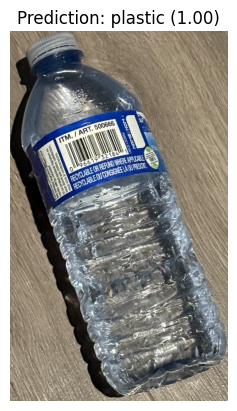

Completed image analysis.


In [ ]:
pred1 = predict_single_image(
    img_path="/content/test_images/IMG_9515.jpeg",
    yolo_model_path="yolov8n.pt",
    cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
    global_path=global_path
) #plastic water bottle



 Processing: /content/test_images/IMG_9516.jpeg
Detected 1 object(s).

 Classification Results:
  • temp_crop_0.jpg → metal (0.915)


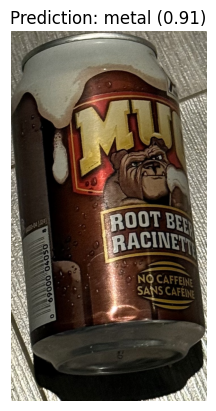

Completed image analysis.


In [ ]:
pred2 = predict_single_image(
    img_path="/content/test_images/IMG_9516.jpeg",
    yolo_model_path="yolov8n.pt",
    cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
    global_path=global_path
) #metal can


 Processing: /content/test_images/IMG_9520.jpeg
Detected 1 object(s).

 Classification Results:
  • temp_crop_0.jpg → other (0.678)


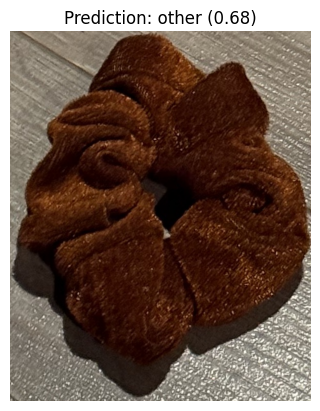

Completed image analysis.


In [ ]:
pred3 = predict_single_image(
    img_path="/content/test_images/IMG_9520.jpeg",
    yolo_model_path="yolov8n.pt",
    cnn_checkpoint_name='best_finetuned_yolo_2025-11-09_23-50-05',
    global_path=global_path
) #other class


 Processing: /content/IMG_8936.jpeg
Detected 2 object(s).

 Classification Results:
  • temp_crop_0.jpg → plastic (0.997)
  • temp_crop_1.jpg → plastic (0.952)


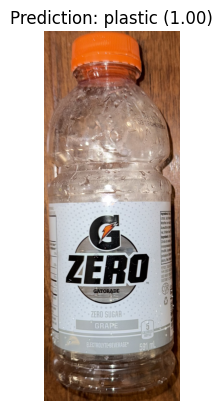

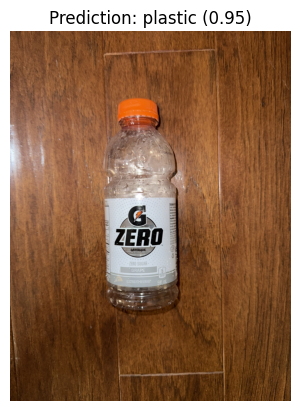

Completed image analysis.


In [ ]:
pred1 = predict_single_image(
    img_path="/content/IMG_8936.jpeg",
    yolo_model_path="yolov8n.pt",
    cnn_checkpoint_name='best_optuna_2025-11-22_22-43-24_crop',
    global_path=global_path
) #plastic water bottle

In [ ]:
%%shell
jupyter nbconvert --to html /content/Trash_Segmentation.ipynb

[NbConvertApp] Converting notebook /content/Trash_Segmentation.ipynb to html
[NbConvertApp] WARNING | Alternative text is missing on 3 image(s).
[NbConvertApp] Writing 1773124 bytes to /content/Trash_Segmentation.html


### Plan for Completion

**Provide a convincing argument for the feasibility of completing the project within the time remaining**

We have made a lot of progress thus far towards our final project. We have completed gathering all of the data that will be used in the training and validation sets. We have prepared all of our data from our two sources TrashBox and TrashNet, and split those into training, validation, and test sets. The training set was augmented and preprocessed into the desired 224x224 image size. We have found the model we want to use for transfer learning, and have adapted the linear layer classification architecture to predict our 6 classes. Our model was trained on these images initially, and some tuning was performed. We then cropped our images using YOLO to prepare for the more practical application of real-time classification. The model was then fine-tuned on the YOLO cropped images and the best models at each step of the training process were saved. We have evaluated our models on validation data and are already getting promising results with F1 score being around 0.82.

All that is pending at this point is testing any further ideas that we have to improve our model even more, or train it further for more epochs. This means potentially doing a more exaustive hyperparamater search, tuning the backbone of the model more, and subsequent tuning on YOLO cropped images. We need to connect our model to a live video stream of trash to prove that our model is capable of real-time classification tasks. There is not much left in terms of coding tasks that are remaining, we just need to see if our model can improve any more and ensure that our model works for real-time classification, so we are confident that completing this project is feasible, espcially given that we are getting good results already. We are happy with our progress at this point and look forward to showing the capabilities of our model.

### Webcam input sample code -- note this won't be able to run in collab

In [ ]:
import cv2
import torch
from ultralytics import YOLO
from torchvision import transforms
from PIL import Image
import numpy as np

device = "cuda" if torch.cuda.is_available() else "cpu"

def predict_live_video(
        yolo_model_path="yolov8n.pt",
        cnn_checkpoint_path="best_finetuned_yolo.pt",
        num_classes=6,
        img_size=224,
        class_names=None):

    # -------------------------------
    # 1. Load YOLO (load ONCE)
    # -------------------------------
    print("Loading YOLO model...")
    yolo = YOLO(yolo_model_path)

    # -------------------------------
    # 2. Load CNN classifier (load ONCE)
    # -------------------------------
    print("Loading CNN classifier...")

    model = make_model(num_classes) #make sure to run above functions to be able to do this
    ckpt = torch.load(cnn_checkpoint_path, map_location=device)
    model.load_state_dict(ckpt["state_dict"])
    model.to(device).eval()

    if class_names is None:
        class_names = ckpt["classes"]  # loaded from checkpoint

    # -------------------------------
    # 3. Define transforms ONCE
    # -------------------------------
    val_tf = transforms.Compose([
        transforms.Resize((img_size, img_size)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    # -------------------------------
    # 4. Initialize webcam
    # -------------------------------
    print("Starting webcam...")
    cap = cv2.VideoCapture(0)

    if not cap.isOpened():
        print("ERROR: Could not access webcam.")
        return

    # -------------------------------
    # 5. Live feed loop
    # -------------------------------
    print("Press 'q' to quit.")
    while True:

        ret, frame = cap.read()
        if not ret:
            print("Failed to read frame.")
            break

        # YOLO expects BGR or RGB — works with frame directly
        results = yolo.predict(frame, verbose=False)
        boxes = results[0].boxes.xyxy.cpu().numpy() if results and results[0].boxes else []

        # Process detections
        for (x1, y1, x2, y2) in boxes:

            x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])

            # Extract crop directly from frame (no saving)
            crop = frame[y1:y2, x1:x2]
            if crop.size == 0:
                continue

            # Convert BGR → RGB
            crop_rgb = cv2.cvtColor(crop, cv2.COLOR_BGR2RGB)
            pil_img = Image.fromarray(crop_rgb)

            # Preprocess
            x = val_tf(pil_img).unsqueeze(0).to(device)

            # CNN inference
            with torch.no_grad():
                logits = model(x)
                pred_idx = logits.argmax(1).item()
                pred_class = class_names[pred_idx]
                conf = torch.softmax(logits, dim=1)[0, pred_idx].item()

            # Draw box + label on live feed
            cv2.rectangle(frame,
                          (x1, y1),
                          (x2, y2),
                          (0, 255, 0), 2)

            text = f"{pred_class} ({conf:.2f})"
            cv2.putText(frame,
                        text,
                        (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX,
                        0.6,
                        (0, 255, 0),
                        2)

        # Show frame
        cv2.imshow("Live YOLO + Trash Classifier", frame)

        # Quit on 'q'
        if cv2.waitKey(1) & 0xFF == ord("q"):
            break

    # Cleanup
    cap.release()
    cv2.destroyAllWindows()


## References

[1] Howard, A., Sandler, M., Chu, G., Chen, L.-C., Chen, B., Tan, M., Wang, W., Zhu, Y., Pang, R., Vasudevan, V., Le, Q. V., & Adam, H. (2019). Searching for MobileNetV3. arXiv. https://arxiv.org/abs/1905.02244

[2] Ozkefe, F. (2020). TrashNet Waste Image Dataset. Kaggle. https://www.kaggle.com/datasets/feyzazkefe/trashnet

[3] minhle13. (n.d.). TrashBox. Kaggle. https://www.kaggle.com/datasets/minhle13/trashbox

[4] Akiba, T., Sano, S., Yanase, T., Ohta, T., & Koyama, M. (2019). Optuna: A next-generation hyperparameter optimization framework. ACM SIGKDD International Conference on Knowledge Discovery & Data Mining. https://optuna.org/